In [1]:
import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import boost_histogram as bh
import simweights
import scipy as scp
path='/net/big-tank/POOL/users/pgutjahr/data/data/leading_muons/evaluation_01/Corsika_evaluated'
f1=h5py.File('/net/big-tank/POOL/users/pgutjahr/data/data/leading_muons/evaluation_01/Corsika_evaluated/30011/level2/00000-00999/Corsika_30011_level2_00000010.hdf5','r')
files=glob.glob('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_dnn_many/Corsika/3001*/level2/00000-00999/*')
files2=glob.glob('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_dnn_manyV2/dnn_manyV2/Corsika/3001*/level2/00000-00999/*')
files3=glob.glob('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_dnn_manyV4/dnn_manyV4/Corsika/3001*/level2/00000-00999/*')
f2=h5py.File('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_dnn_many/Corsika/30011/level2/00000-00999/Corsika_30011_level2_00000010.hdf5')
f3=h5py.File('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_dnn_manyV2/dnn_manyV2/Corsika/30011/level2/00000-00999/Corsika_30011_level2_00000010.hdf5')
f4=h5py.File('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_dnn_manyV4/dnn_manyV4/Corsika/30011/level2/00000-00999/Corsika_30011_level2_00000010.hdf5')

In [2]:
for key in f3.keys():
    print(key)

CorsikaWeightMap
DeepLearningReco_PromtMu_L2_direction
DeepLearningReco_PromtMu_L2_direction_I3Particle
DeepLearningReco_direction_big
DeepLearningReco_direction_big_I3Particle
DeepLearningReco_direction_bigger_conv
DeepLearningReco_direction_bigger_conv_2
DeepLearningReco_direction_bigger_conv_2_I3Particle
DeepLearningReco_direction_bigger_conv_I3Particle
DeepLearningReco_direction_even_bigger
DeepLearningReco_direction_even_bigger_I3Particle
DeepLearningReco_direction_smaller_conv
DeepLearningReco_direction_smaller_conv_I3Particle
DeepLearningReco_energy_bigger_convolutional
DeepLearningReco_energy_bigger_convolutional_I3Particle
DeepLearningReco_energy_bigger_convolutional_max
DeepLearningReco_energy_bigger_convolutional_max_I3Particle
DeepLearningReco_energy_bigger_model
DeepLearningReco_energy_bigger_model_I3Particle
DeepLearningReco_energy_num_muons
DeepLearningReco_energy_num_muons_I3Particle
DeepLearningReco_energy_small_bias
DeepLearningReco_energy_small_bias_I3Particle
DeepLe

In [3]:
for key in f4.keys():
    print(key)

CorsikaWeightMap
DeepLearningReco_PromtMu_L2_direction
DeepLearningReco_PromtMu_L2_direction_I3Particle
DeepLearningReco_direction_big
DeepLearningReco_direction_big_I3Particle
DeepLearningReco_direction_bigger_conv
DeepLearningReco_direction_bigger_conv_2
DeepLearningReco_direction_bigger_conv_2_I3Particle
DeepLearningReco_direction_bigger_conv_I3Particle
DeepLearningReco_direction_even_bigger
DeepLearningReco_direction_even_bigger_I3Particle
DeepLearningReco_direction_smaller_conv
DeepLearningReco_direction_smaller_conv_I3Particle
DeepLearningReco_direction_smaller_conv_pooling
DeepLearningReco_direction_smaller_conv_pooling_I3Particle
DeepLearningReco_energy_bigger_convolutional
DeepLearningReco_energy_bigger_convolutional_I3Particle
DeepLearningReco_energy_bigger_convolutional_max
DeepLearningReco_energy_bigger_convolutional_max_I3Particle
DeepLearningReco_energy_bigger_convolutional_max_biasV2
DeepLearningReco_energy_bigger_convolutional_max_biasV2_I3Particle
DeepLearningReco_ener

In [4]:
def add_simweights(df: pd.DataFrame, model_class: list[simweights._fluxes.CosmicRayFlux] | simweights._fluxes.CosmicRayFlux):
    """ Adds weights for all primary models in model_class (from simweights._fluxes) to the df.
        The key will be "simweights_{name of model_class}" for each model. 
    """
    
    if not isinstance(model_class, list):
        model_class = [model_class]
    

    for primary_model in model_class:   
        df['simweights_'+primary_model.__name__] = np.empty(len(df))

    weight_keys = [
        "CylinderLength",
        "CylinderRadius",
        "EnergyPrimaryMax",
        "EnergyPrimaryMin",
        "NEvents",
        "OverSampling",
        "ParticleType",
        "PrimaryEnergy",
        "PrimarySpectralIndex",
        "PrimaryType",
        "ThetaMax",
        "ThetaMin",
        "Weight",
    ]

    # loop through different files
    e_low = np.unique(df.EnergyPrimaryMin)

    for e_l in e_low:
        mask = df.EnergyPrimaryMin == e_l
        print(f'minimum primary energy: {e_l} GeV')
        number_corsika_files = len(np.unique(df.Run[mask]))
        print('number of processed files: ', number_corsika_files)

        CorsikaWeightMap: dict = {k: [df[k][mask]] for k in weight_keys}
        PolyplopiaPrimary: dict = {k: [df[k][mask]] for k in ["type", "energy", "zenith"]}


        fobj = {"CorsikaWeightMap": CorsikaWeightMap, "PolyplopiaPrimary": PolyplopiaPrimary}
        wobj = simweights.CorsikaWeighter(fobj, nfiles=number_corsika_files)

        for primary_model in model_class:   
            df.loc[mask, 'simweights_'+primary_model.__name__] = wobj.get_weights(primary_model())

In [5]:
CorsikaWeightMap=pd.DataFrame([])
for file in files3:
    df_poly=pd.read_hdf(file,key='PolyplopiaPrimary')
    df_poly=pd.concat([df_poly,pd.read_hdf(file,key='CorsikaWeightMap')],axis=1)
    CorsikaWeightMap=pd.concat([CorsikaWeightMap,df_poly])

In [6]:
df_energy_MuEX=pd.DataFrame([])
for file in files3:
    df_energy_MuEX=pd.concat([df_energy_MuEX,pd.read_hdf(file, key='MPEFitMuEX')])

In [7]:
df_DNN_energy_bigger_conv=pd.DataFrame([])
df_DNN_energy_s_max=pd.DataFrame([])
df_DNN_energy_s_bias=pd.DataFrame([])
df_DNN_energy_num=pd.DataFrame([])
df_DNN_energy_bigger_max=pd.DataFrame([])
df_MCLabelsLeading=pd.DataFrame([])
df_MCLabelsParent=pd.DataFrame([])
df_DNN_leading=pd.DataFrame([])
df_DNN_bundle=pd.DataFrame([])
for file in files3:
    df_DNN_energy_bigger_conv=pd.concat([df_DNN_energy_bigger_conv,pd.read_hdf(file,key='DeepLearningReco_energy_bigger_convolutional')])
    df_DNN_energy_s_max=pd.concat([df_DNN_energy_s_max,pd.read_hdf(file,key='DeepLearningReco_energy_small_max_pool')])
    df_DNN_energy_s_bias=pd.concat([df_DNN_energy_s_bias,pd.read_hdf(file,key='DeepLearningReco_energy_small_bias')])
    df_DNN_energy_num=pd.concat([df_DNN_energy_num,pd.read_hdf(file,key='DeepLearningReco_energy_num_muons')])
    df_DNN_energy_bigger_max=pd.concat([df_DNN_energy_bigger_max,pd.read_hdf(file,key='DeepLearningReco_energy_bigger_convolutional_max')])
    df_MCLabelsLeading=pd.concat([df_MCLabelsLeading,pd.read_hdf(file,key='MCLabelsLeadingMuons')])
    df_MCLabelsParent=pd.concat([df_MCLabelsParent,pd.read_hdf(file,key='MCLabelsMostEnergeticMuonParentInfo')])
    df_DNN_leading=pd.concat([df_DNN_leading,pd.read_hdf(file,key='DeepLearningReco_energy_leading_small')])
    df_DNN_bundle=pd.concat([df_DNN_bundle,pd.read_hdf(file,key='DeepLearningReco_energy_bundle')])

/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_mctree'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.90_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use nat

In [8]:
df_DNN_energy=pd.DataFrame([])
df_DNN_energy_s=pd.DataFrame([])
for file in files3:
    df_DNN_energy=pd.concat([df_DNN_energy,pd.read_hdf(file,key='DeepLearningReco_exported_model_PromptMu_L2_energy')])
    df_DNN_energy_s=pd.concat([df_DNN_energy_s,pd.read_hdf(file,key='DeepLearningReco_energy_smaller_model')])

In [9]:
df_DNN_energy2=pd.DataFrame([])
df_DNN_energy_s2=pd.DataFrame([])
df_DNN_energy_s_max2=pd.DataFrame([])
df_MCLabelsLeading2=pd.DataFrame([])
for file in files2:
    df_DNN_energy2=pd.concat([df_DNN_energy2,pd.read_hdf(file,key='DeepLearningReco_exported_model_PromptMu_L2_energy')])
    df_DNN_energy_s2=pd.concat([df_DNN_energy_s2,pd.read_hdf(file,key='DeepLearningReco_energy_smaller_model')])
    df_DNN_energy_s_max2=pd.concat([df_DNN_energy_s_max2,pd.read_hdf(file,key='DeepLearningReco_energy_small_max_pool')])
    df_MCLabelsLeading2=pd.concat([df_MCLabelsLeading2,pd.read_hdf(file,key='MCLabelsLeadingMuons')])

/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_mctree'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.90_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use nat

In [10]:
CorsikaWeightMap2=pd.DataFrame([])
for file in files2:
    df_poly2=pd.read_hdf(file,key='PolyplopiaPrimary')
    df_poly2=pd.concat([df_poly2,pd.read_hdf(file,key='CorsikaWeightMap')],axis=1)
    CorsikaWeightMap2=pd.concat([CorsikaWeightMap2,df_poly2])

In [11]:
df_MCLabelsParent2=pd.DataFrame([])
for file in files2:
    df_MCLabelsParent2=pd.concat([df_MCLabelsParent2,pd.read_hdf(file,key='MCLabelsMostEnergeticMuonParentInfo')])

In [12]:
np.size(df_MCLabelsLeading.leading_energy_rel_entry[df_MCLabelsLeading.leading_energy_rel_entry>0.25])/np.size(df_MCLabelsLeading.leading_energy_rel_entry)

0.31319053561877597

In [13]:
np.size(df_MCLabelsLeading.bundle_energy_at_entry[df_MCLabelsLeading.bundle_energy_at_entry>10**5.5])/np.size(df_MCLabelsLeading.bundle_energy_at_entry)

0.24624710287038687

In [14]:
add_simweights(CorsikaWeightMap2, [simweights.GaisserH3a, simweights.GlobalFitGST, simweights.GlobalSplineFit5Comp])

minimum primary energy: 600.0 GeV
number of processed files:  200
minimum primary energy: 1000000.0 GeV
number of processed files:  200
minimum primary energy: 100000000.0 GeV
number of processed files:  999
minimum primary energy: 1000000000.0 GeV
number of processed files:  103


In [15]:
add_simweights(CorsikaWeightMap, [simweights.GaisserH3a, simweights.GlobalFitGST, simweights.GlobalSplineFit5Comp])

minimum primary energy: 600.0 GeV
number of processed files:  200
minimum primary energy: 1000000.0 GeV
number of processed files:  200
minimum primary energy: 100000000.0 GeV
number of processed files:  999
minimum primary energy: 1000000000.0 GeV
number of processed files:  175


In [16]:
def nansem(a):
    return scp.stats.sem(a, nan_policy='omit')
def mid(b):
    return 10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)

In [17]:
def cut(mask,df_DNN,entry,bundle):
    pred_cut=df_DNN[mask]
    true_cut=df_MCLabelsLeading[mask]
    weights_cut=CorsikaWeightMap[mask]
    Parent_cut=df_MCLabelsParent[mask]
    pred_high_entry=Parent_cut[pred_cut.entry_energy>=10**5]
    pred_high_bundle=Parent_cut[pred_cut.bundle_energy_at_entry>=10**5]
    high_entry=df_MCLabelsParent[df_DNN.entry_energy>=10**5]
    high_bundle=df_MCLabelsParent[df_DNN.bundle_energy_at_entry>=10**5]
    print('fraction total cut:', np.size(pred_cut.entry_energy)/np.size(df_DNN.entry_energy))
    print('fraction prompt cut:', np.size(pred_cut.entry_energy[Parent_cut.is_prompt_dennis==1])/np.size(df_DNN.entry_energy[df_MCLabelsParent.is_prompt_dennis==1]))
    if entry==1:
        print('fraction entry prompt over 10**5:', np.size(pred_high_entry.is_prompt_dennis[pred_high_entry.is_prompt_dennis==1])/np.size(high_entry.is_prompt_dennis[high_entry.is_prompt_dennis==1]))
    if bundle==1:
        print('fraction bundle prompt over 10**5:', np.size(pred_high_bundle.is_prompt_dennis[pred_high_bundle.is_prompt_dennis==1])/np.size(high_bundle.is_prompt_dennis[high_bundle.is_prompt_dennis==1]))    
    return pred_cut,true_cut,weights_cut,Parent_cut

In [18]:
def correlation_plot(pred: pd.DataFrame,true: pd.DataFrame,min1,max1,type1):
    bins=np.logspace(min1,max1,100)
    if type1==1:
        plt.hist2d(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,bins=bins,norm='log')
        plt.xlabel('predicted bundle energy at entry [GeV]')
        plt.ylabel('true bundle energy at entry [GeV]')
    if type1==0:
        plt.hist2d(pred.entry_energy,true.entry_energy,bins=bins,norm='log')
        plt.xlabel('predicted leading muon energy [GeV]')
        plt.ylabel('true leading muon energy [GeV]')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim([10**min1,10**max1])
    plt.ylim([10**min1,10**max1])
    plt.colorbar(label='number of events')
    plt.plot(bins,bins)
def correlation_plot_weighted(pred: pd.DataFrame,true: pd.DataFrame,weights,min1,max1,type1):
    bins=np.logspace(min1,max1,100)
    if type1==1:
        plt.hist2d(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,weights=weights,bins=bins_bundle,norm='log')
        plt.xlabel('predicted bundle energy at entry')
        plt.ylabel('true bundle energy at entry')
    if type1==0:
        plt.hist2d(pred.entry_energy,true.entry_energy,weights=weights,bins=bins,norm='log')
        plt.xlabel('predicted entry energy')
        plt.ylabel('true entry energy')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim([10**min1,10**max1])
    plt.ylim([10**min1,10**max1])
    plt.colorbar()
    plt.plot(bins,bins)

In [19]:
def add_mean_error_entry(pred: pd.DataFrame, true:pd.DataFrame, bins, step):
    sem, bins1, digitized=scp.stats.binned_statistic(pred.entry_energy,true.entry_energy,bins=bins,statistic=nansem)
    mean, bins1, digitized=scp.stats.binned_statistic(pred.entry_energy,true.entry_energy,bins=bins,statistic=np.nanmean)
    plt.errorbar(mid(bins)[::step],mean[::step],sem[::step],fmt='x',label='mean')
    plt.legend()
def add_mean_error_bundle(pred: pd.DataFrame, true:pd.DataFrame, bins, step):
    sem, bins1, digitized=scp.stats.binned_statistic(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,bins=bins,statistic=nansem)
    mean, bins1, digitized=scp.stats.binned_statistic(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,bins=bins,statistic=np.nanmean)
    plt.errorbar(mid(bins)[::step],mean[::step],sem[::step],fmt='x',label='mean')
    plt.legend()  
def add_median_bundle(pred:pd.DataFrame, true:pd.DataFrame, bins, step):
    median, bins1, digitized=scp.stats.binned_statistic(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,bins=bins,statistic=np.nanmedian)
    plt.plot(mid(bins)[::step],median[::step],fmt='x',label='median')
    plt.legend()
def add_median_entry(pred: pd.DataFrame, true:pd.DataFrame, bins, step):
    median, bins1, digitized=scp.stats.binned_statistic(pred.entry_energy,true.entry_energy,bins=bins,statistic=np.nanmedian)
    plt.plot(mid(bins)[::step],median[::step],fmt='x',label='median')
    plt.legend()

In [20]:
def prompt_conventional_flux_entry(b,energy: pd.DataFrame, Parent: pd.DataFrame, weights):
    plt.hist(energy.entry_energy[Parent.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=weights[Parent.is_prompt_dennis==0],color='blue')
    plt.hist(energy.entry_energy[Parent.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt', weights=weights[Parent.is_prompt_dennis==1],color='orange')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlim([np.min(b),np.max(b)])
    plt.xlabel('leading muon energy[GeV]')
    plt.ylabel('event rate[1/s]')
    plt.legend()
    errors_conventional, error_edges_conventional=bh.numpy.histogram(energy.entry_energy[Parent.is_prompt_dennis==0],bins=b,weights=weights[Parent.is_prompt_dennis==0]**2)
    errors_prompt, errors_edges_prompt=bh.numpy.histogram(energy.entry_energy[Parent.is_prompt_dennis==1],bins=b,weights=weights[Parent.is_prompt_dennis==1]**2)
    conventional_weighted, bins_conv=bh.numpy.histogram(energy.entry_energy[Parent.is_prompt_dennis==0],bins=b, weights=weights[Parent.is_prompt_dennis==0])
    prompt_weighted, bins_prompt=bh.numpy.histogram(energy.entry_energy[Parent.is_prompt_dennis==1],bins=b, weights=weights[Parent.is_prompt_dennis==1])
    mid=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
    plt.errorbar(mid,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x',color='blue')
    plt.errorbar(mid,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x',color='orange')
    #plt.step(b[:np.size(b)-1],conventional_weighted,where='post',label='conventional')
    #plt.step(b[:np.size(b)-1], prompt_weighted, where='post', label='prompt')
def prompt_conventional_flux_bundle(b,energy: pd.DataFrame, Parent: pd.DataFrame, weights):
    plt.hist(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=weights[Parent.is_prompt_dennis==0],color='blue')
    plt.hist(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt', weights=weights[Parent.is_prompt_dennis==1],color='orange')
    plt.xscale('log')
    plt.xlim([np.min(b),np.max(b)])
    plt.xlabel('bundle energy [GeV]')
    plt.ylabel('event rate[1/s]')
    plt.legend()
    errors_conventional, error_edges_conventional=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==0],bins=b,weights=weights[Parent.is_prompt_dennis==0]**2)
    errors_prompt, errors_edges_prompt=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==1],bins=b,weights=weights[Parent.is_prompt_dennis==1]**2)
    conventional_weighted, bins_conv=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==0],bins=b, weights=weights[Parent.is_prompt_dennis==0])
    prompt_weighted, bins_prompt=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==1],bins=b, weights=weights[Parent.is_prompt_dennis==1])
    mid=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
    plt.errorbar(mid,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x',color='blue')
    plt.errorbar(mid,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x',color='orange')    

In [21]:
def prompt_conventional_fraction_bundle(b,energy: pd.DataFrame,true: pd.DataFrame, Parent: pd.DataFrame, weights):
    conventional_weighted, bins_conv=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==0],bins=b, weights=weights[Parent.is_prompt_dennis==0])
    prompt_weighted, bins_prompt=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==1],bins=b, weights=weights[Parent.is_prompt_dennis==1])
    conventional_weighted_MC, bins_conv=bh.numpy.histogram(true.bundle_energy_at_entry[Parent.is_prompt_dennis==0],bins=b, weights=weights[Parent.is_prompt_dennis==0])
    prompt_weighted_MC, bins_prompt=bh.numpy.histogram(true.bundle_energy_at_entry[Parent.is_prompt_dennis==1],bins=b, weights=weights[Parent.is_prompt_dennis==1])
    plt.plot(mid(b),conventional_weighted/conventional_weighted_MC,'x',label='conventional',color='blue')
    plt.plot(mid(b),prompt_weighted/prompt_weighted_MC,'x',label='prompt',color='orange')
    plt.xlim([np.min(b),np.max(b)])
    plt.ylim([10**(-2.2),10**(0)])
    plt.xscale('log')
    plt.yscale('log')
    plt.legend()

In [22]:
def under_5(x):
    return np.nanquantile(x,0.05)
def over_5(x):
    return np.nanquantile(x,0.95)
def band_90(x,y,bins):
    under,bins2,digitized=scp.stats.binned_statistic(x,y,bins=bins,statistic=under_5)
    over,bins2,digitized=scp.stats.binned_statistic(x,y,bins=bins,statistic=over_5)
    plt.plot(mid(bins),under,color='red')
    plt.plot(mid(bins),over,color='red')

In [23]:
def mean_residual(pred,true):
    pred1=pred[true!=0]
    true1=true[true!=0]
    print(np.mean(np.log10(pred1)-np.log10(true1)))
    return np.nanmean(np.log10(pred1)-np.log10(true1))
def std_residual(pred,true):
    pred1=pred[true!=0]
    true1=true[true!=0]
    print(np.std(np.log10(pred1)-np.log10(true1)))
    return np.nanstd(np.log10(pred1)-np.log10(true1))

In [24]:
bins_entry=np.logspace(1,7,100)
bins_bundle=np.logspace(1,8,100)

0.21501735071923234


0.21501735071923234

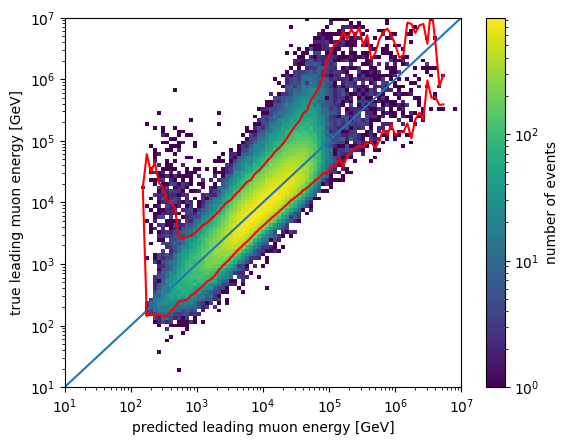

In [25]:
#plt.subplot(121,aspect='equal')
correlation_plot(df_DNN_energy_bigger_max,df_MCLabelsLeading,1,7,0)
#plt.subplot(122,aspect='equal')
#correlation_plot(df_DNN_energy_bigger_conv,df_MCLabelsLeading,1,8,1)
#scp.stats.pearsonr(df_DNN_energy_bigger_conv.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry)
scp.stats.spearmanr(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry)
band_90(df_DNN_energy_bigger_max.entry_energy,df_MCLabelsLeading.entry_energy,np.logspace(1,7,100))
std_residual(df_DNN_energy_s_bias.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry)

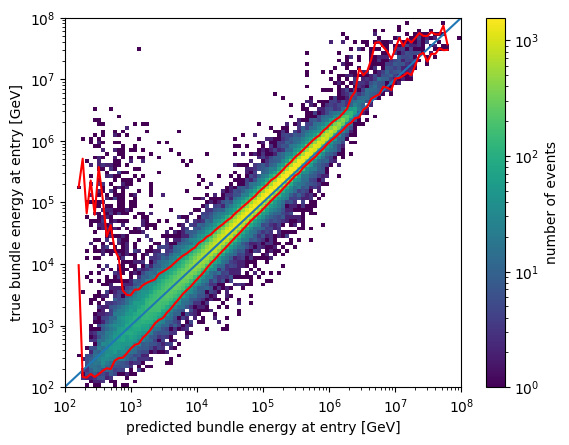

In [26]:
correlation_plot(df_DNN_energy_bigger_max,df_MCLabelsLeading,2,8,1)
under, bi, digitized=scp.stats.binned_statistic(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry,bins=np.logspace(2,8,100),statistic=under_5)
over, bi, digitized=scp.stats.binned_statistic(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry,bins=np.logspace(2,8,100),statistic=over_5)
#plt.plot(mid(np.logspace(2,8,100)),under,color='red')
#plt.plot(mid(np.logspace(2,8,100)),over,color='red')
band_90(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry,np.logspace(2,8,100))

SignificanceResult(statistic=-0.7523095977444292, pvalue=0.0)


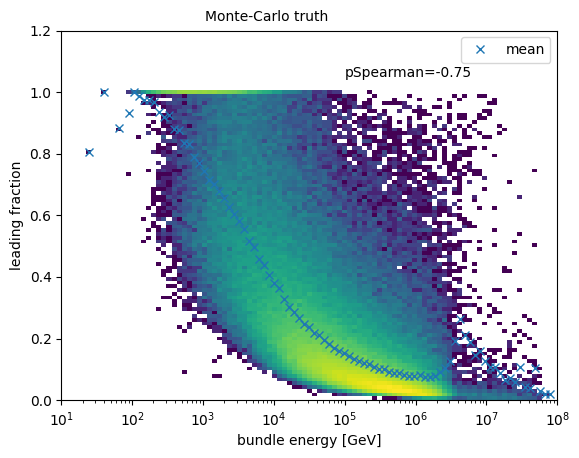

In [27]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry,df_MCLabelsLeading.leading_energy_rel_entry,norm='log',bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)])
plt.xscale('log')
mean_rel, bins1, digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=np.logspace(1,8,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x',label='mean')
print(scp.stats.spearmanr(df_MCLabelsLeading.bundle_energy_at_entry[np.isfinite(df_MCLabelsLeading.leading_energy_rel_entry)],df_MCLabelsLeading.leading_energy_rel_entry[np.isfinite(df_MCLabelsLeading.leading_energy_rel_entry)]))
#band_90(df_MCLabelsLeading.bundle_energy_at_entry,df_MCLabelsLeading.leading_energy_rel_entry,np.logspace(1,8,100))
plt.xlabel('bundle energy [GeV]')
plt.ylabel('leading fraction')
plt.figtext(0.35,0.9,'Monte-Carlo truth')
plt.text(10**5,1.05,'pSpearman=-0.75')
plt.legend()
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_MC_bundle_leading.pdf')

SignificanceResult(statistic=-0.9548138154407687, pvalue=0.0)


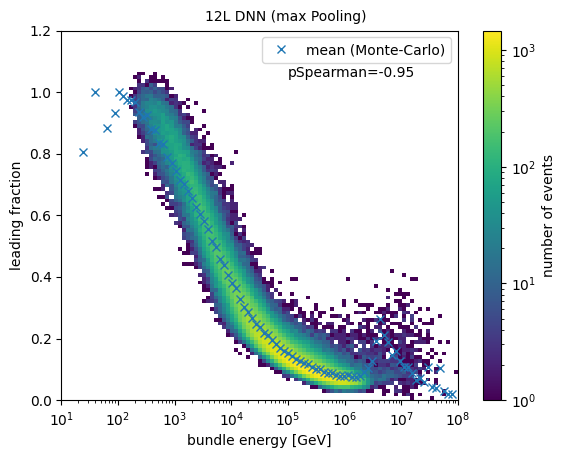

In [28]:
plt.hist2d(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_DNN_energy_bigger_max.leading_energy_rel_entry,norm='log',bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)])
plt.xscale('log')
#mean_rel, bins1, digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=np.logspace(1,8,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x',label='mean (Monte-Carlo)')
print(scp.stats.spearmanr(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_DNN_energy_bigger_max.leading_energy_rel_entry))
#band_90(df_MCLabelsLeading.bundle_energy_at_entry,df_MCLabelsLeading.leading_energy_rel_entry,np.logspace(1,8,100))
plt.xlabel('bundle energy [GeV]')
plt.ylabel('leading fraction')
plt.figtext(0.35,0.9,'12L DNN (max Pooling)')
plt.text(10**5,1.05,'pSpearman=-0.95')
plt.colorbar(label='number of events')
plt.legend()

SignificanceResult(statistic=-0.9612935276816179, pvalue=0.0)


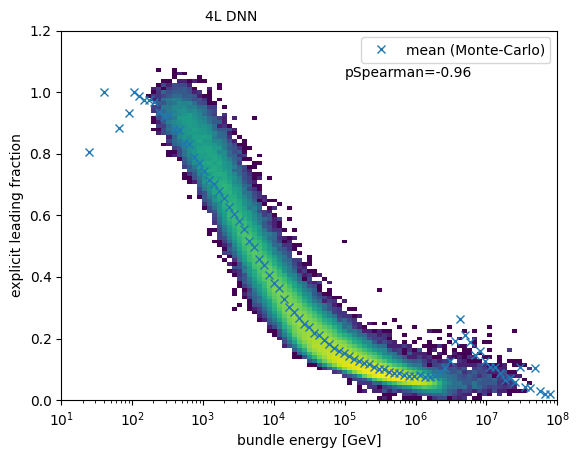

In [29]:
plt.hist2d(df_DNN_energy_s.bundle_energy_at_entry,df_DNN_energy_s.leading_energy_rel_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x',label='mean (Monte-Carlo)')
plt.xscale('log')
scp.stats.spearmanr(df_DNN_energy_s.bundle_energy_at_entry,df_DNN_energy_s.leading_energy_rel_entry)
print(scp.stats.spearmanr(df_DNN_energy_s.bundle_energy_at_entry,df_DNN_energy_s.leading_energy_rel_entry))
plt.xlabel('bundle energy [GeV]')
plt.ylabel('explicit leading fraction')
plt.figtext(0.35,0.9,'4L DNN')
plt.text(10**5,1.05,'pSpearman=-0.96')
plt.legend()
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_4L_bundle_leading.pdf')

SignificanceResult(statistic=-0.9503674866815256, pvalue=0.0)


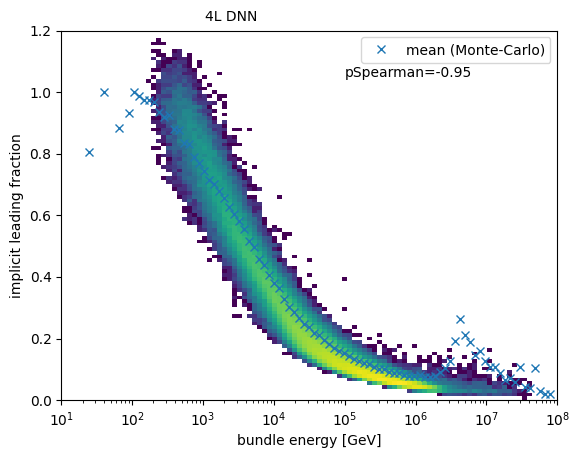

In [30]:
plt.hist2d(df_DNN_energy_s.bundle_energy_at_entry,df_DNN_energy_s.entry_energy/df_DNN_energy_s.bundle_energy_at_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x',label='mean (Monte-Carlo)')
plt.xscale('log')
scp.stats.spearmanr(df_DNN_energy_s.bundle_energy_at_entry,df_DNN_energy_bigger_conv.leading_energy_rel_entry)
print(scp.stats.spearmanr(df_DNN_energy_s.bundle_energy_at_entry,df_DNN_energy_s.entry_energy/df_DNN_energy.bundle_energy_at_entry))
plt.xlabel('bundle energy [GeV]')
plt.ylabel('implicit leading fraction')
plt.figtext(0.35,0.9,'4L DNN')
plt.text(10**5,1.05,'pSpearman=-0.95')
plt.legend()
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_4L_bundle_leading_implicit.pdf')

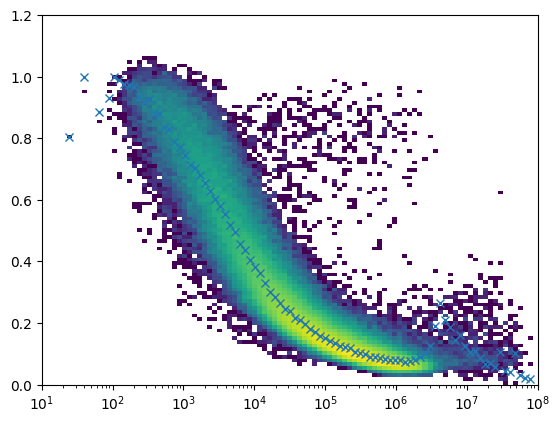

In [31]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry,df_DNN_energy_bigger_max.leading_energy_rel_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x',label='mean (Monte-Carlo)')
plt.xscale('log')

SignificanceResult(statistic=-0.9437128483723904, pvalue=0.0)

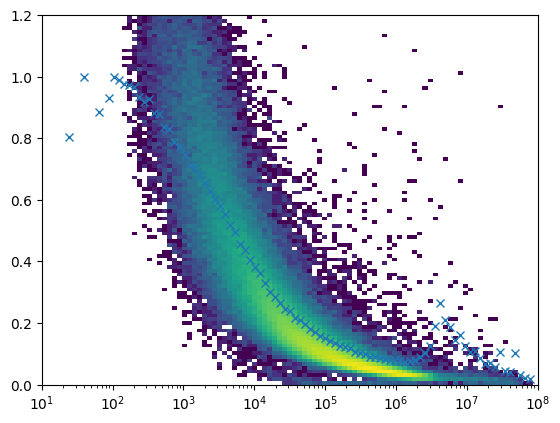

In [32]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry,df_DNN_energy_bigger_conv.entry_energy/df_MCLabelsLeading.bundle_energy_at_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x')
plt.xscale('log')
scp.stats.spearmanr(df_DNN_energy_bigger_conv.bundle_energy_at_entry,df_DNN_energy_bigger_conv.leading_energy_rel_entry)

SignificanceResult(statistic=-0.9637173883429432, pvalue=0.0)


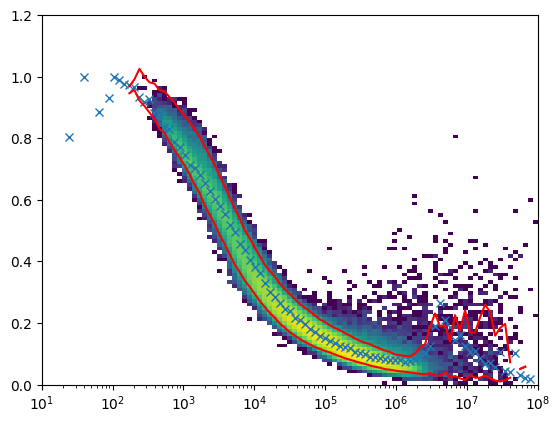

In [33]:
plt.hist2d(df_DNN_energy_s_bias.bundle_energy_at_entry,df_DNN_energy_s_bias.leading_energy_rel_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x')
plt.xscale('log')
print(scp.stats.spearmanr(df_DNN_energy_s_bias.bundle_energy_at_entry,df_DNN_energy_s_bias.leading_energy_rel_entry))
band_90(df_DNN_energy_s_max.bundle_energy_at_entry,df_DNN_energy_s_max.leading_energy_rel_entry,bins=np.logspace(1,8,100))

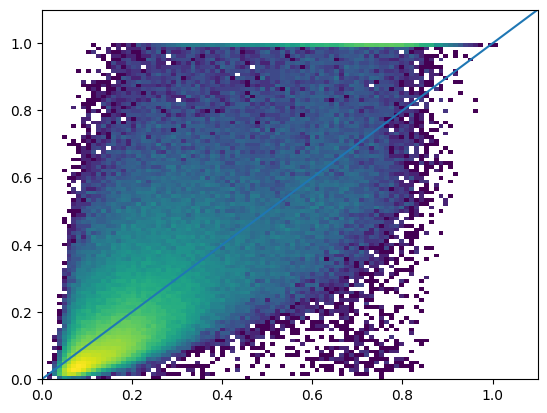

In [34]:
plt.hist2d(df_DNN_energy_s_bias.leading_energy_rel_entry[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=1.3],df_MCLabelsLeading.leading_energy_rel_entry[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=1.3],range=[[0,1.1],[0,1.1]],norm='log',bins=100)
plt.plot(np.linspace(0,1.1),np.linspace(0,1.1))

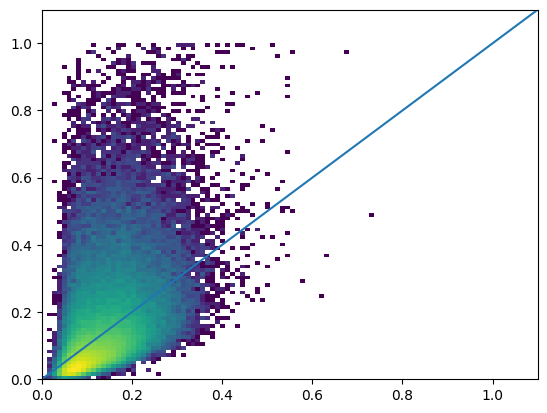

In [35]:
plt.hist2d(df_DNN_energy_s_bias.leading_energy_rel_entry[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty<=0.15],df_MCLabelsLeading.leading_energy_rel_entry[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty<=0.15],range=[[0,1.1],[0,1.1]],norm='log',bins=100)
plt.plot(np.linspace(0,1.1),np.linspace(0,1.1))

In [36]:
rel_entry_cut_pred,rel_entry_cut_true,rel_entry_cut_Parent,rel_entry_cut_Corsika=cut(df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=1.2,df_DNN_energy_s_bias,1,0)

fraction total cut: 0.8706874156330388
fraction prompt cut: 0.7338692616881743
fraction entry prompt over 10**5: 0.2555309734513274


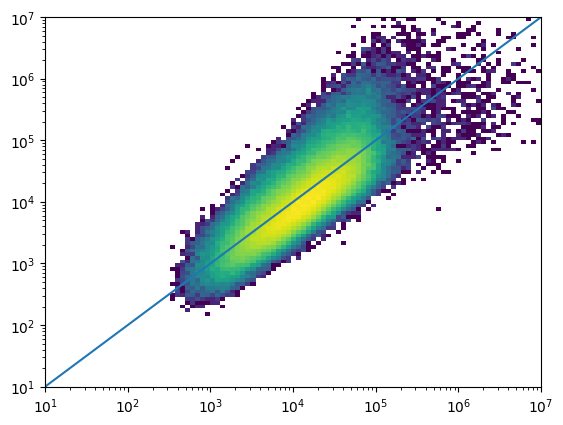

In [37]:
plt.hist2d(df_DNN_energy_s_bias.leading_energy_rel_entry[df_DNN_energy_s_bias.bundle_energy_at_entry_log_uncertainty<=0.68]*df_DNN_energy_s_bias.bundle_energy_at_entry[df_DNN_energy_s_bias.bundle_energy_at_entry_log_uncertainty<=0.68],df_MCLabelsLeading.entry_energy[df_DNN_energy_s_bias.bundle_energy_at_entry_log_uncertainty<=0.68],norm='log',bins=bins_entry)
plt.xscale('log')
plt.yscale('log')
plt.plot(bins_entry,bins_entry)

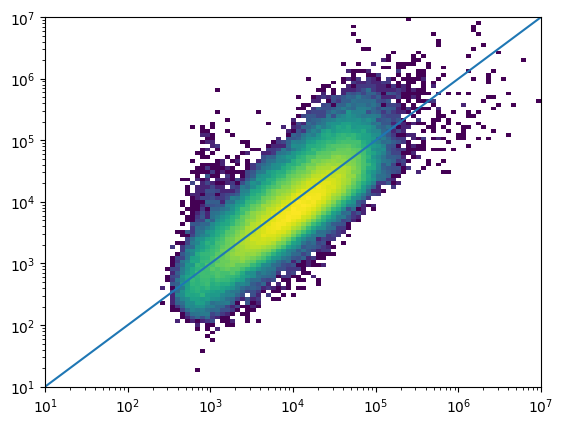

In [38]:
plt.hist2d(rel_entry_cut_pred.leading_energy_rel_entry*rel_entry_cut_pred.bundle_energy_at_entry,rel_entry_cut_true.entry_energy,norm='log',bins=bins_entry)
plt.xscale('log')
plt.yscale('log')
plt.plot(bins_entry,bins_entry)

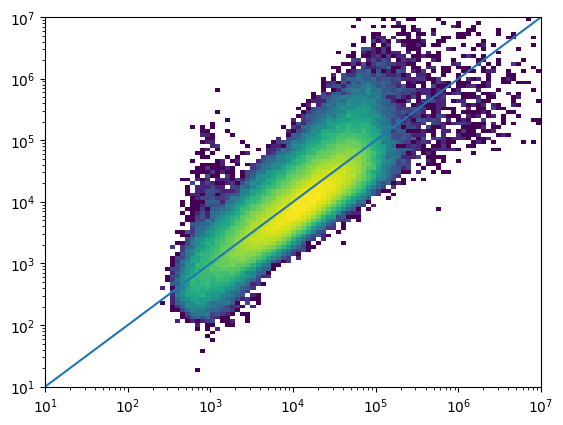

In [39]:
mask=np.any([df_DNN_energy_s_bias.bundle_energy_at_entry_log_uncertainty<=0.68,df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=0.5],axis=0)
plt.hist2d(df_DNN_energy_s_bias.leading_energy_rel_entry[mask]*df_DNN_energy_s_bias.bundle_energy_at_entry[mask],df_MCLabelsLeading.entry_energy[mask],bins=bins_entry,norm='log')
plt.xscale('log')
plt.yscale('log')
plt.plot(bins_entry,bins_entry)

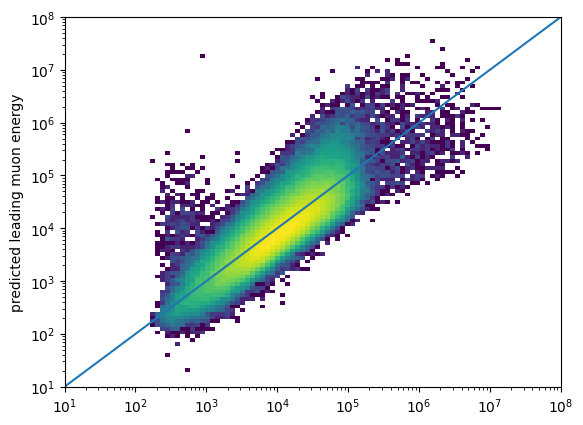

In [40]:
plt.hist2d(df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.entry_energy,bins=np.logspace(1,8,100),norm='log')
plt.xscale('log')
plt.yscale('log')
plt.ylabel('true leading muon energy')
plt.ylabel('predicted leading muon energy')
plt.plot(np.logspace(1,8,100),np.logspace(1,8,100))

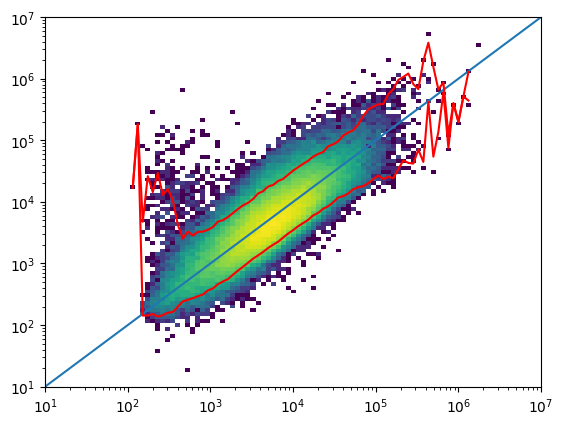

In [41]:
c=0.8
plt.hist2d(df_DNN_energy_s_bias.leading_energy_rel_entry[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=c]*df_DNN_energy_bigger_max.bundle_energy_at_entry[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=c],df_MCLabelsLeading.entry_energy[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=c],norm='log',bins=bins_entry)
plt.xscale('log')
plt.yscale('log')
plt.plot(bins_entry,bins_entry)
np.size(df_MCLabelsLeading.entry_energy[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=c])/np.size(df_MCLabelsLeading.entry_energy)
band_90(df_DNN_energy_s_bias.leading_energy_rel_entry[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=c]*df_DNN_energy_bigger_max.bundle_energy_at_entry[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=c],df_MCLabelsLeading.entry_energy[df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=c],bins=bins_entry)

/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


99
PearsonRResult(statistic=0.290605369733316, pvalue=0.0)
SignificanceResult(statistic=0.8471215313705394, pvalue=0.0)


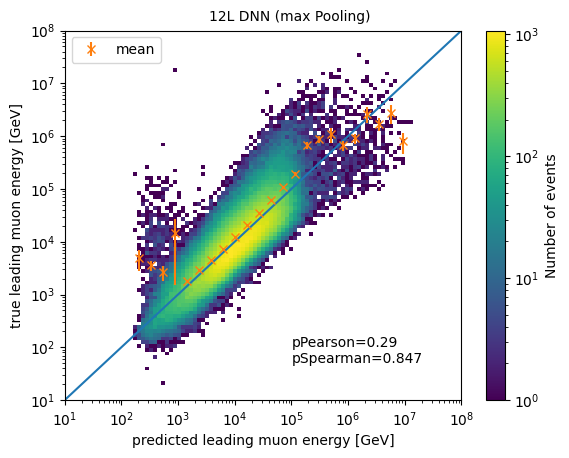

In [42]:
plt.hist2d(df_DNN_energy_bigger_max.bundle_energy_at_entry*df_DNN_energy_bigger_max.leading_energy_rel_entry,df_MCLabelsLeading.entry_energy,norm='log',bins=np.logspace(1,8,100))
plt.xscale('log')
plt.yscale('log')
plt.xlabel('predicted leading muon energy [GeV]')
plt.ylabel('true leading muon energy [GeV]')
plt.plot(np.logspace(1,8,100),np.logspace(1,8,100))
plt.colorbar(label='Number of events')
plt.figtext(0.35,0.9,'12L DNN (max Pooling)')
sem1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.entry_energy,bins=np.logspace(1,8,100),statistic=nansem)
mean1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.entry_energy,bins=np.logspace(1,8,100),statistic=np.nanmean)
plt.errorbar(mid(np.logspace(1,8,100))[::3],mean1[::3],sem1[::3],fmt='x',label='mean')
print(np.size(mean1))
print(scp.stats.pearsonr(df_DNN_energy_bigger_max.bundle_energy_at_entry[np.isfinite(df_MCLabelsLeading.entry_energy)]*df_DNN_energy_bigger_max.leading_energy_rel_entry[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
print(scp.stats.spearmanr(df_DNN_energy_bigger_max.bundle_energy_at_entry[np.isfinite(df_MCLabelsLeading.entry_energy)]*df_DNN_energy_bigger_max.leading_energy_rel_entry[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
plt.text(10**5,10**2,'pPearson=0.29')
plt.text(10**5,10**1.7,'pSpearman=0.847')
plt.legend()

In [43]:
np.all(np.isfinite(df_MCLabelsLeading.entry_energy))

False

-4029.07289904228


/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


0.8651453021929043

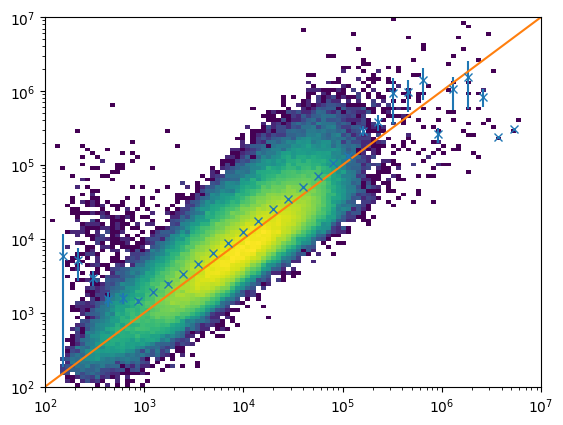

In [44]:
bins_entry2=np.logspace(2,7,100)
mask2=np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry_log_uncertainty<=0.95,df_DNN_energy_s_bias.leading_energy_rel_entry_uncertainty/df_DNN_energy_s_bias.leading_energy_rel_entry<=1.2],axis=0)
plt.hist2d(df_DNN_energy_s_bias.leading_energy_rel_entry[mask2]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask2],df_MCLabelsLeading.entry_energy[mask2],bins=bins_entry2,norm='log')
plt.xscale('log')
plt.yscale('log')
sem1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_s_bias.leading_energy_rel_entry[mask2]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask2],df_MCLabelsLeading.entry_energy[mask2],bins=bins_entry2,statistic=nansem)
mean1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_s_bias.leading_energy_rel_entry[mask2]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask2],df_MCLabelsLeading.entry_energy[mask2],bins=bins_entry2,statistic=np.nanmean)
plt.errorbar(mid(bins_entry2)[::3],mean1[::3],sem1[::3],fmt='x')
plt.plot(bins_entry,bins_entry)
print(np.mean(df_DNN_energy_s_bias.leading_energy_rel_entry[mask2]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask2]-df_MCLabelsLeading.entry_energy[mask2]))
np.size(df_MCLabelsLeading.entry_energy[mask2])/np.size(df_MCLabelsLeading.entry_energy)

/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


99
-8786.159834762637


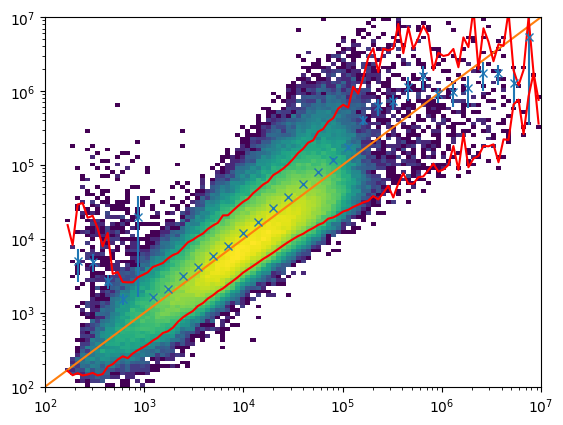

In [45]:
mask3=np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry_log_uncertainty<=1.4,df_DNN_energy_bigger_max.leading_energy_rel_entry_uncertainty/df_DNN_energy_bigger_max.leading_energy_rel_entry<=1.6],axis=0)
plt.hist2d(df_DNN_energy_bigger_max.leading_energy_rel_entry[mask3]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask3],df_MCLabelsLeading.entry_energy[mask3],bins=bins_entry2,norm='log')
plt.xscale('log')
plt.yscale('log')
sem1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_bigger_max.leading_energy_rel_entry[mask3]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask3],df_MCLabelsLeading.entry_energy[mask3],bins=bins_entry2,statistic=nansem)
mean1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_bigger_max.leading_energy_rel_entry[mask3]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask3],df_MCLabelsLeading.entry_energy[mask3],bins=bins_entry2,statistic=np.nanmean)
print(np.size(mean1))
plt.errorbar(mid(bins_entry2)[::3],mean1[::3],sem1[::3],fmt='x')
plt.plot(bins_entry,bins_entry)
print(np.mean(df_DNN_energy_bigger_max.leading_energy_rel_entry[mask3]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask3]-df_MCLabelsLeading.entry_energy[mask3]))
np.size(df_MCLabelsLeading.entry_energy[mask3])/np.size(df_MCLabelsLeading.entry_energy)
band_90(df_DNN_energy_bigger_max.leading_energy_rel_entry[mask3]*df_DNN_energy_bigger_max.bundle_energy_at_entry[mask3],df_MCLabelsLeading.entry_energy[mask3],bins=bins_entry2)

/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


111187.39064205937
0.9846980617884522


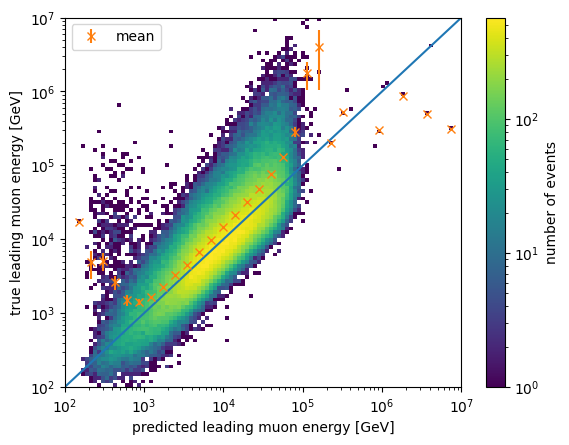

In [46]:
correlation_plot(df_DNN_energy_bigger_max[df_DNN_energy_bigger_max.entry_energy_log_uncertainty<=np.quantile(df_DNN_energy_bigger_max.entry_energy_log_uncertainty,0.9847)],df_MCLabelsLeading[df_DNN_energy_bigger_max.entry_energy_log_uncertainty<=np.quantile(df_DNN_energy_bigger_max.entry_energy_log_uncertainty,0.9847)],2,7,0)
add_mean_error_entry(df_DNN_energy_bigger_max[df_DNN_energy_bigger_max.entry_energy_log_uncertainty<=np.quantile(df_DNN_energy_bigger_max.entry_energy_log_uncertainty,0.9847)],df_MCLabelsLeading[df_DNN_energy_bigger_max.entry_energy_log_uncertainty<=np.quantile(df_DNN_energy_bigger_max.entry_energy_log_uncertainty,0.9847)],np.logspace(2,7,100),3)
print(np.std(df_DNN_energy_bigger_max.entry_energy[df_DNN_energy_bigger_max.entry_energy_log_uncertainty<=np.quantile(df_DNN_energy_bigger_max.entry_energy_log_uncertainty,0.9847)]-df_MCLabelsLeading.entry_energy[df_DNN_energy_bigger_max.entry_energy_log_uncertainty<=np.quantile(df_DNN_energy_bigger_max.entry_energy_log_uncertainty,0.9847)]))
print(np.size(df_MCLabelsLeading.entry_energy[df_DNN_energy_bigger_max.entry_energy_log_uncertainty<=np.quantile(df_DNN_energy_bigger_max.entry_energy_log_uncertainty,0.9847)])/np.size(df_MCLabelsLeading.entry_energy))

PearsonRResult(statistic=0.8240505017042847, pvalue=0.0)
SignificanceResult(statistic=0.9876177537939319, pvalue=0.0)


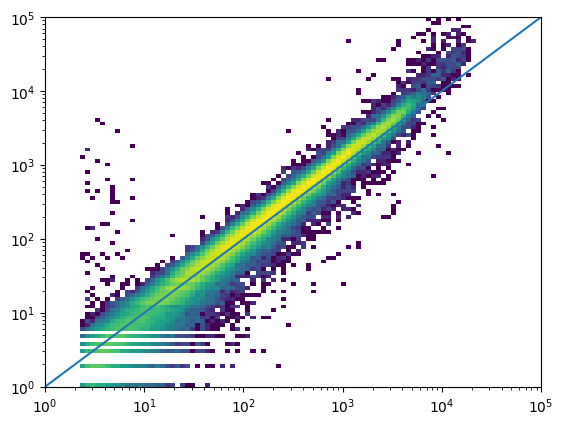

In [47]:
plt.hist2d(df_DNN_energy_bigger_max.num_muons_at_entry[df_DNN_energy_bigger_max.num_muons_at_entry_uncertainty/df_DNN_energy_bigger_max.num_muons_at_entry<=0.48],df_MCLabelsLeading.num_muons_at_entry[df_DNN_energy_bigger_max.num_muons_at_entry_uncertainty/df_DNN_energy_bigger_max.num_muons_at_entry<=0.48],bins=np.logspace(0,5,100),norm='log')
plt.xscale('log')
plt.yscale('log')
plt.plot(np.logspace(0,5),np.logspace(0,5))
#np.any(df_MCLabelsLeading.num_muons_at_entry==4)
print(scp.stats.pearsonr(df_DNN_energy_bigger_max.num_muons_at_entry[df_DNN_energy_bigger_max.num_muons_at_entry_uncertainty/df_DNN_energy_bigger_max.num_muons_at_entry<=0.4],df_MCLabelsLeading.num_muons_at_entry[df_DNN_energy_bigger_max.num_muons_at_entry_uncertainty/df_DNN_energy_bigger_max.num_muons_at_entry<=0.4]))
print(scp.stats.spearmanr(df_DNN_energy_bigger_max.num_muons_at_entry[df_DNN_energy_bigger_max.num_muons_at_entry_uncertainty/df_DNN_energy_bigger_max.num_muons_at_entry<=0.4],df_MCLabelsLeading.num_muons_at_entry[df_DNN_energy_bigger_max.num_muons_at_entry_uncertainty/df_DNN_energy_bigger_max.num_muons_at_entry<=0.4]))

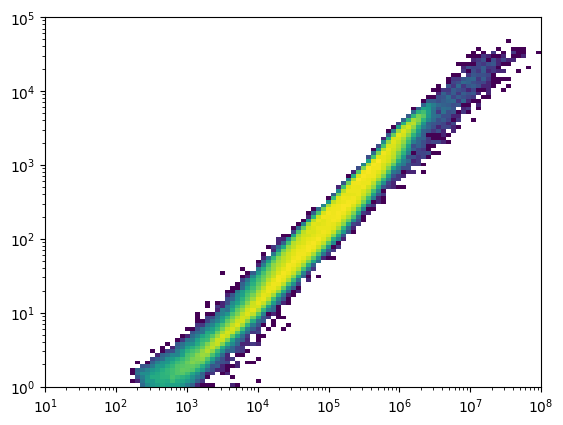

In [48]:
plt.hist2d(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_DNN_energy_bigger_max.num_muons_at_entry,bins=[np.logspace(1,8,100),np.logspace(0,5,100)],norm='log')
plt.xscale('log')
plt.yscale('log')

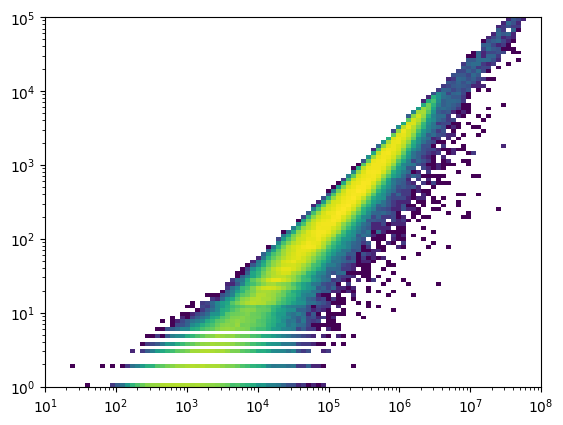

In [49]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry,df_MCLabelsLeading.num_muons_at_entry,bins=[np.logspace(1,8,100),np.logspace(0,5,100)],norm='log')
plt.xscale('log')
plt.yscale('log')

SignificanceResult(statistic=0.9783854093338742, pvalue=0.0)
PearsonRResult(statistic=0.6660450334537775, pvalue=0.0)


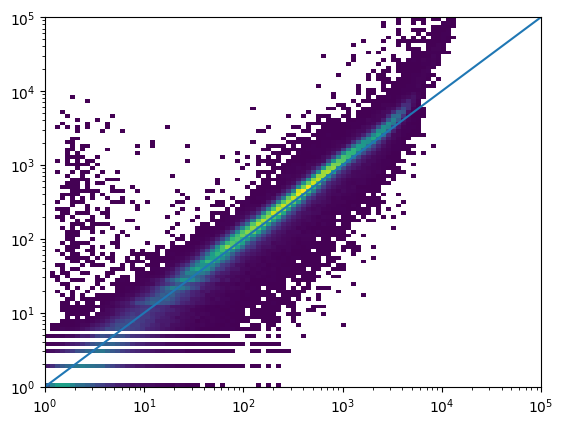

In [50]:
bins_num=np.logspace(0,5,100)
plt.hist2d(df_DNN_energy_num.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry,bins=bins_num,cmin=1)
plt.xscale('log')
plt.yscale('log')
plt.plot(bins_num,bins_num)
print(scp.stats.spearmanr(df_DNN_energy_num.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry))
print(scp.stats.pearsonr(df_DNN_energy_num.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry))

SignificanceResult(statistic=0.9783854093338742, pvalue=0.0)


PearsonRResult(statistic=0.6660450334537775, pvalue=0.0)

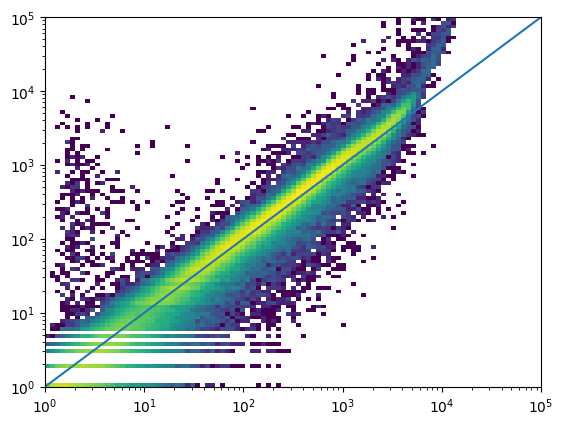

In [51]:
bins_num=np.logspace(0,5,100)
plt.hist2d(df_DNN_energy_num.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry,bins=bins_num,norm='log')
plt.xscale('log')
plt.yscale('log')
plt.plot(bins_num,bins_num)
print(scp.stats.spearmanr(df_DNN_energy_num.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry))
scp.stats.pearsonr(df_DNN_energy_num.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry)

SignificanceResult(statistic=0.9783854093338742, pvalue=0.0)


PearsonRResult(statistic=0.6660450334537775, pvalue=0.0)

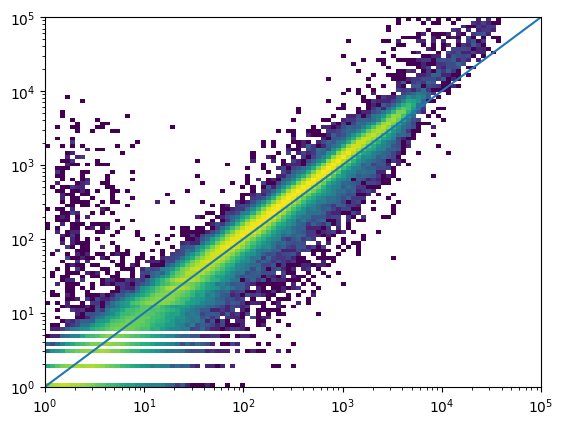

In [52]:
plt.hist2d(df_DNN_energy_bigger_max.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry,bins=bins_num,norm='log')
plt.xscale('log')
plt.yscale('log')
plt.plot(bins_num,bins_num)
print(scp.stats.spearmanr(df_DNN_energy_num.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry))
scp.stats.pearsonr(df_DNN_energy_num.num_muons_at_entry,df_MCLabelsLeading.num_muons_at_entry)

/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


PearsonRResult(statistic=0.290605369733316, pvalue=0.0)
SignificanceResult(statistic=0.8471215313705394, pvalue=0.0)


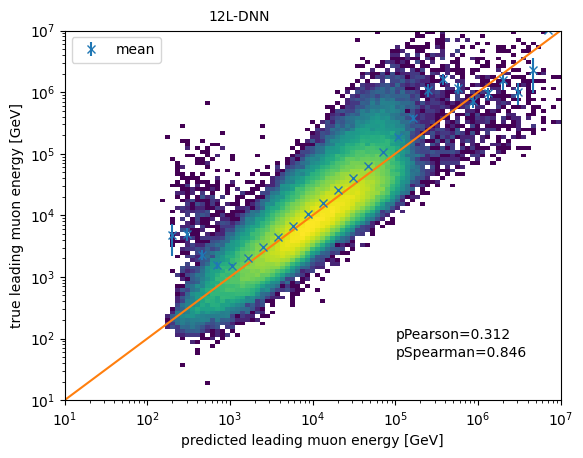

In [53]:
plt.hist2d(df_DNN_energy_bigger_max.bundle_energy_at_entry*df_DNN_energy_bigger_max.leading_energy_rel_entry,df_MCLabelsLeading.entry_energy,bins=np.logspace(1,7,100),norm='log')
plt.xscale('log')
plt.yscale('log')
sem1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.entry_energy,bins=bins_entry,statistic=nansem)
mean1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.entry_energy,bins=bins_entry,statistic=np.nanmean)
plt.errorbar(mid(bins_entry)[::3],mean1[::3],sem1[::3],fmt='x',label='mean')
plt.plot(bins_entry,bins_entry)
print(scp.stats.pearsonr(df_DNN_energy_bigger_max.bundle_energy_at_entry[np.isfinite(df_MCLabelsLeading.entry_energy)]*df_DNN_energy_bigger_max.leading_energy_rel_entry[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
print(scp.stats.spearmanr(df_DNN_energy_bigger_max.bundle_energy_at_entry[np.isfinite(df_MCLabelsLeading.entry_energy)]*df_DNN_energy_bigger_max.leading_energy_rel_entry[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
#band_90(df_DNN_energy_bigger_max.bundle_energy_at_entry*df_DNN_energy_bigger_max.leading_energy_rel_entry,df_MCLabelsLeading.entry_energy,np.logspace(1,7,100))
plt.xlabel('predicted leading muon energy [GeV]')
plt.ylabel('true leading muon energy [GeV]')
plt.text(10**5,10**2,'pPearson=0.312')
plt.text(10**5,10**1.7,'pSpearman=0.846')
plt.figtext(0.35,0.9,'12L-DNN')
plt.legend()

In [54]:
max_entry_calc=df_DNN_energy_bigger_max.bundle_energy_at_entry*df_DNN_energy_bigger_max.leading_energy_rel_entry
np.size(max_entry_calc[np.all([max_entry_calc>10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>10**5])

0.22250329960404752

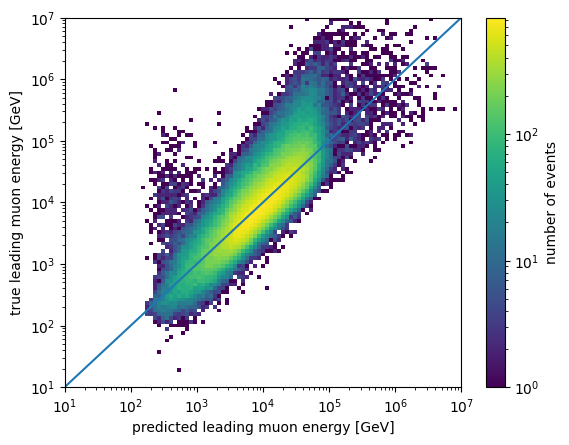

In [55]:
correlation_plot(df_DNN_energy_bigger_max,df_MCLabelsLeading,1,7,0)

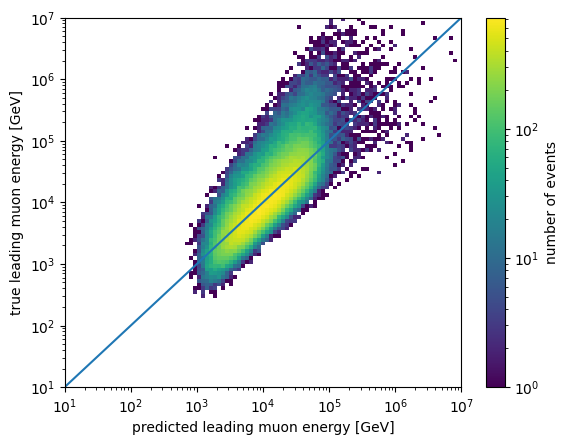

In [56]:
correlation_plot(df_DNN_energy_s_bias[df_DNN_energy_s_bias.bundle_energy_at_entry_log_uncertainty<=0.48],df_MCLabelsLeading[df_DNN_energy_s_bias.bundle_energy_at_entry_log_uncertainty<=0.48],1,7,0)

(1e-11, 0.01)

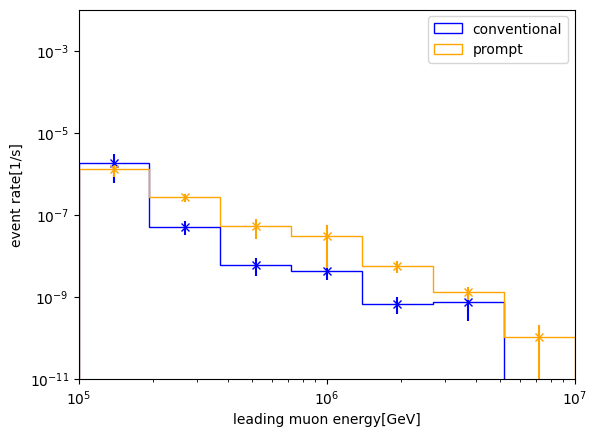

In [57]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy_bigger_max,df_MCLabelsParent,CorsikaWeightMap.simweights_GlobalSplineFit5Comp)
plt.ylim(10**(-11),10**(-2))

(1e-11, 0.0031622776601683794)

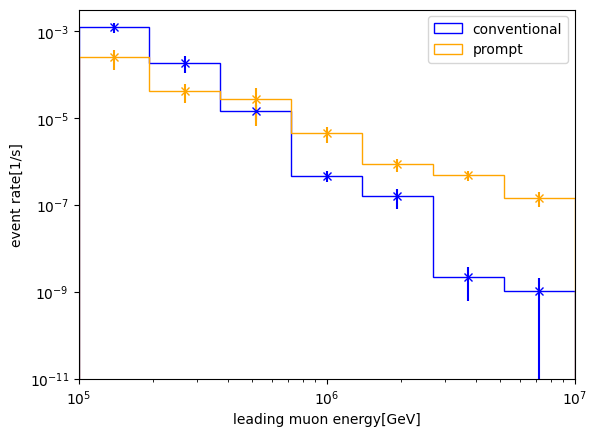

In [58]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GlobalFitGST)
plt.ylim(10**(-11),10**(-2.5))

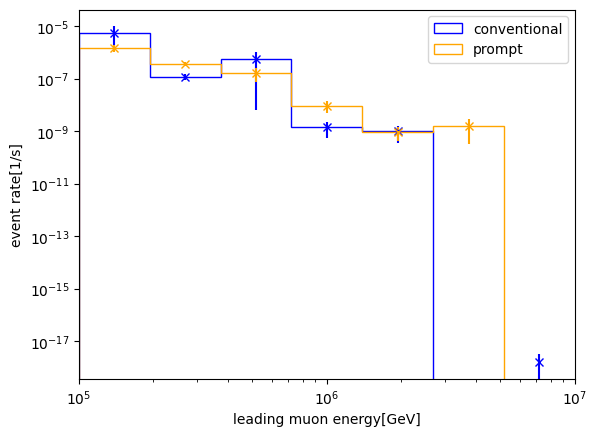

In [59]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy_s_max,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)

0.22250329960404752


Text(0.35, 0.9, '12L-DNN (max Pooling)')

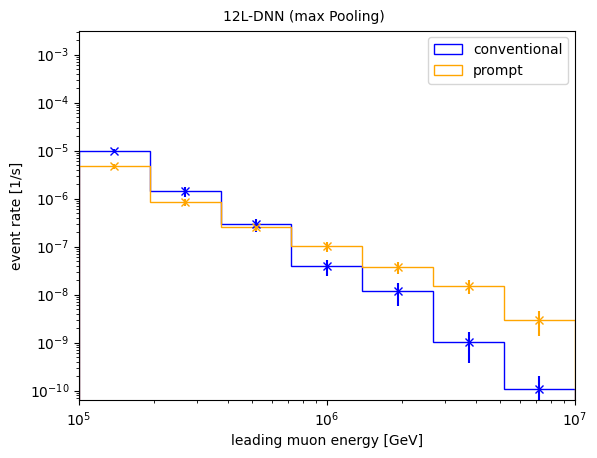

In [60]:
b=np.logspace(5,7,8)
plt.hist(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0],color='blue')
plt.hist(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt',weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1],color='orange')
plt.xscale('log')
plt.xlim([10**5,10**7])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.xlabel('leading muon energy [GeV]')
plt.ylabel('event rate [1/s]')
plt.legend()
errors_conventional, error_edges_conventional=bh.numpy.histogram(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=b,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=b, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1])
mids=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x',color='blue')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x',color='orange')
#prompt_conventional_flux_entry(np.logspace(5,7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GlobalFitGST)
print(np.size(df_DNN_energy_bigger_max.entry_energy[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry*df_DNN_energy_bigger_max.leading_energy_rel_entry>=10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>=10**5]))
plt.figtext(0.35,0.9,'12L-DNN (max Pooling)')

In [61]:
np.size(df_DNN_energy_bigger_max.entry_energy[np.all([df_DNN_energy_s_max.bundle_energy_at_entry*df_DNN_energy_s_max.leading_energy_rel_entry>10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>10**5])

0.19324681038275407

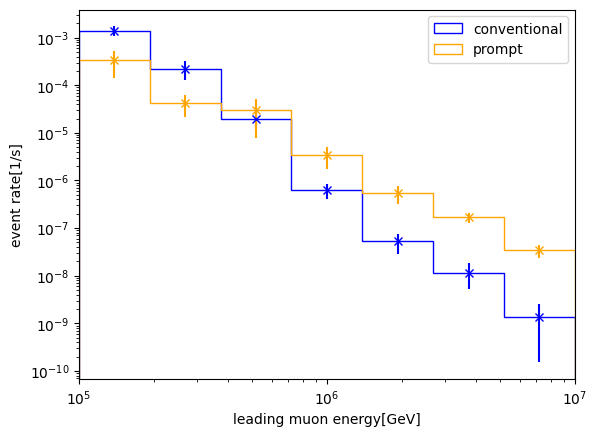

In [62]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)

In [63]:
np.size(df_DNN_energy_bigger_max.entry_energy[df_DNN_energy_s_max.entry_energy>10**5])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>10**5])

0.11757589089309282

fraction total cut: 0.8670809668135394
fraction prompt cut: 0.9174529299767294
fraction entry prompt over 10**5: 0.7876884422110553


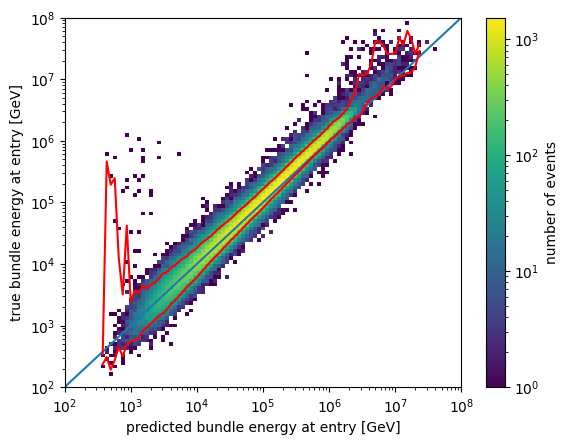

In [64]:
bundle_energy_pred_cut_b,bundle_energy_true_cut_b,bundle_energy_Corsika_cut_b,bundle_energy_Parent_cut_b=cut(df_DNN_energy_bigger_max.bundle_energy_at_entry_log_uncertainty<=0.48,df_DNN_energy_bigger_max,1,0)
correlation_plot(bundle_energy_pred_cut_b,bundle_energy_true_cut_b,2,8,1)
scp.stats.spearmanr(bundle_energy_pred_cut_b.bundle_energy_at_entry,bundle_energy_pred_cut_b.bundle_energy_at_entry)
leading_bundle_cut=df_DNN_energy_s_bias[df_DNN_energy_bigger_max.bundle_energy_at_entry_log_uncertainty<=0.48]
band_90(bundle_energy_pred_cut_b.bundle_energy_at_entry,bundle_energy_true_cut_b.bundle_energy_at_entry,np.logspace(2,8,100))

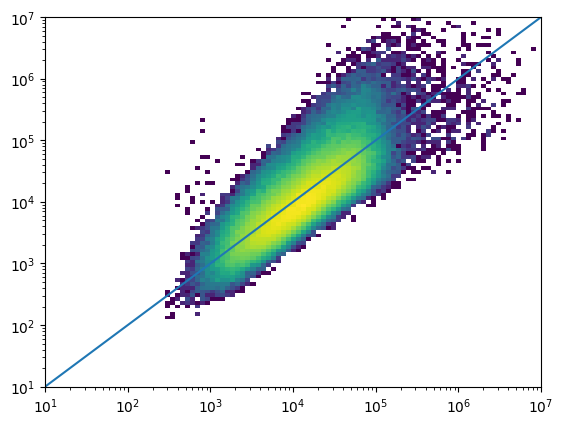

In [65]:
plt.hist2d(bundle_energy_pred_cut_b.bundle_energy_at_entry*leading_bundle_cut.leading_energy_rel_entry,bundle_energy_true_cut_b.entry_energy,bins=bins_entry,norm='log')
plt.xscale('log')
plt.yscale('log')
plt.plot(bins_entry,bins_entry)

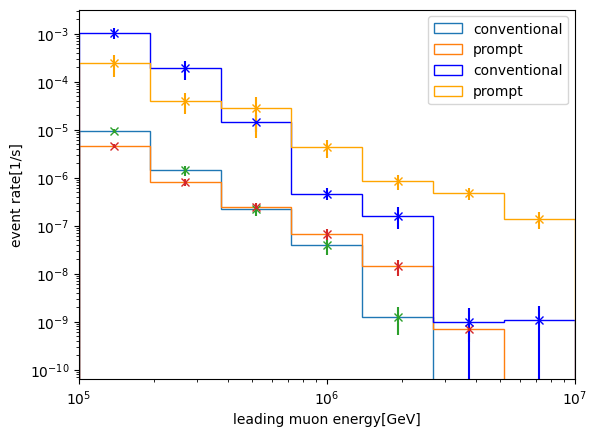

In [66]:
b=np.logspace(5,7,8)
plt.hist(bundle_energy_pred_cut_b.bundle_energy_at_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==0]*bundle_energy_pred_cut_b.leading_energy_rel_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=bundle_energy_Corsika_cut_b.simweights_GaisserH3a[bundle_energy_Parent_cut_b.is_prompt_dennis==0])
plt.hist(bundle_energy_pred_cut_b.bundle_energy_at_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==1]*bundle_energy_pred_cut_b.leading_energy_rel_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt',weights=bundle_energy_Corsika_cut_b.simweights_GaisserH3a[bundle_energy_Parent_cut_b.is_prompt_dennis==1])
plt.xscale('log')
plt.xlim([10**5,10**7])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.xlabel('entry energy leading')
plt.ylabel('event rate[1/s]')
plt.legend()
errors_conventional, error_edges_conventional=bh.numpy.histogram(bundle_energy_pred_cut_b.bundle_energy_at_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==0]*bundle_energy_pred_cut_b.leading_energy_rel_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==0],bins=b,weights=bundle_energy_Corsika_cut_b.simweights_GaisserH3a[bundle_energy_Parent_cut_b.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(bundle_energy_pred_cut_b.bundle_energy_at_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==1]*bundle_energy_pred_cut_b.leading_energy_rel_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==1],bins=b,weights=bundle_energy_Corsika_cut_b.simweights_GaisserH3a[bundle_energy_Parent_cut_b.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(bundle_energy_pred_cut_b.bundle_energy_at_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==0]*bundle_energy_pred_cut_b.leading_energy_rel_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==0],bins=b, weights=bundle_energy_Corsika_cut_b.simweights_GaisserH3a[bundle_energy_Parent_cut_b.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(bundle_energy_pred_cut_b.bundle_energy_at_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==1]*bundle_energy_pred_cut_b.leading_energy_rel_entry[bundle_energy_Parent_cut_b.is_prompt_dennis==1],bins=b, weights=bundle_energy_Corsika_cut_b.simweights_GaisserH3a[bundle_energy_Parent_cut_b.is_prompt_dennis==1])
mids=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x')
prompt_conventional_flux_entry(np.logspace(5,7,8),bundle_energy_true_cut_b,bundle_energy_Parent_cut_b,bundle_energy_Corsika_cut_b.simweights_GlobalFitGST)

(1e-11, 0.015848931924611134)

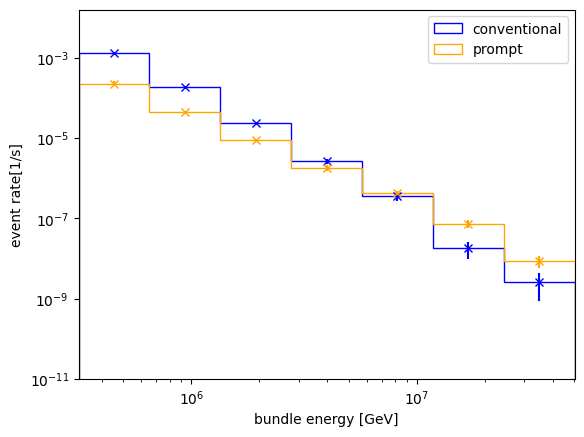

In [67]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),bundle_energy_true_cut_b,bundle_energy_Parent_cut_b,bundle_energy_Corsika_cut_b.simweights_GaisserH3a)
plt.ylim([10**(-11),10**(-1.8)])

(1e-11, 0.015848931924611134)

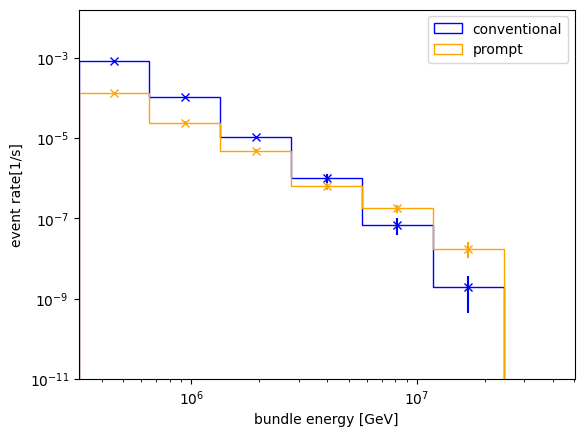

In [68]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),bundle_energy_pred_cut_b,bundle_energy_Parent_cut_b,bundle_energy_Corsika_cut_b.simweights_GaisserH3a)
plt.ylim([10**(-11),10**(-1.8)])

(1e-11, 0.015848931924611134)

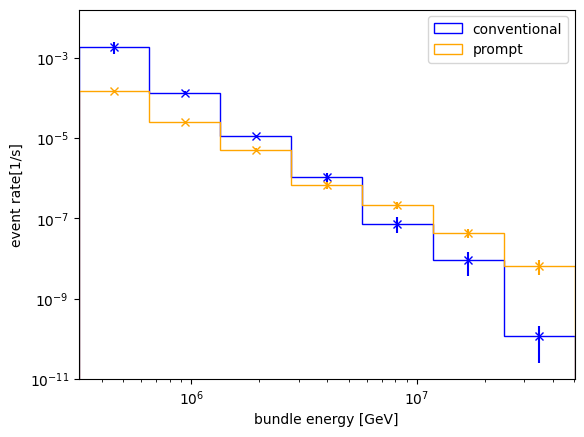

In [69]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_bigger_max,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
#prompt_conventional_flux_bundle(np.logspace(5,7.6,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-11),10**(-1.8)])

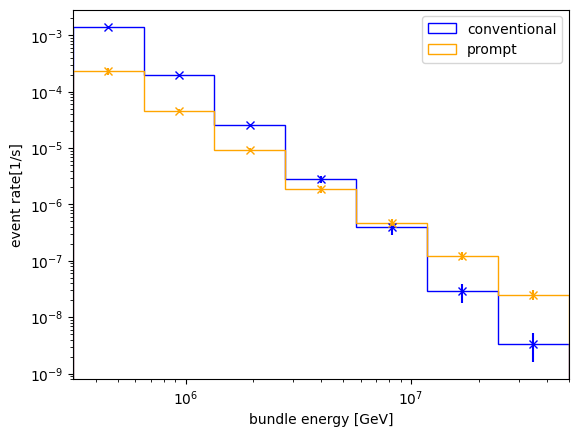

In [70]:
#prompt_conventional_flux_bundle(np.logspace(5,7.6,8),df_DNN_energy_bigger_max,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)

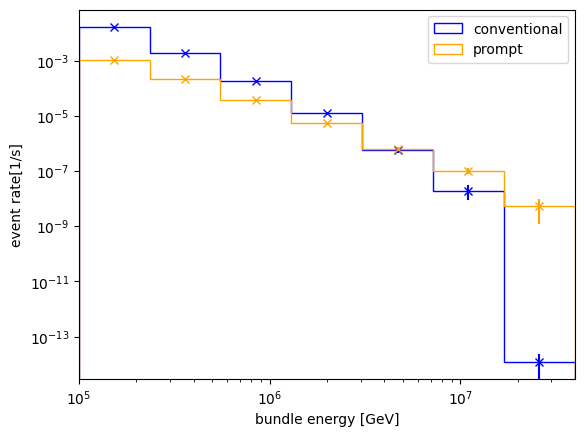

In [71]:
prompt_conventional_flux_bundle(np.logspace(5,7.6,8),bundle_energy_pred_cut_b,bundle_energy_Parent_cut_b,bundle_energy_Corsika_cut_b.simweights_GaisserH3a)
#prompt_conventional_flux_bundle(np.logspace(5,7.6,8),bundle_energy_true_cut_b,bundle_energy_Parent_cut_b,bundle_energy_Corsika_cut_b.simweights_GaisserH3a)

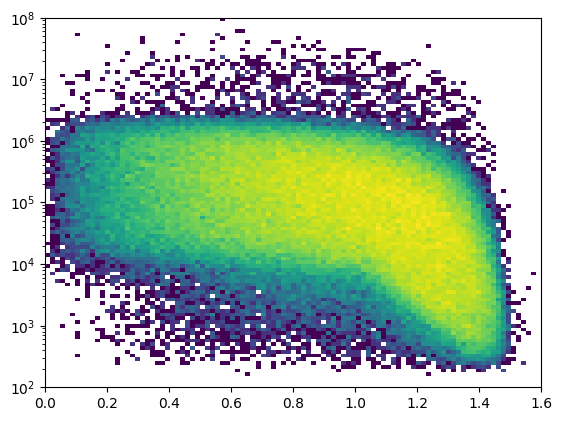

In [72]:
plt.hist2d(df_MCLabelsLeading.PrimaryZenith,df_DNN_energy_bigger_max.bundle_energy_at_entry,norm='log',bins=[np.linspace(0,1.6,100),np.logspace(2,8,100)])
plt.yscale('log')

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 1., 0.]]),
 array([0.        , 0.06060606, 0.12121212, 0.18181818, 0.24242424,
        0.3030303 , 0.36363636, 0.42424242, 0.48484848, 0.54545455,
        0.60606061, 0.66666667, 0.72727273, 0.78787879, 0.84848485,
        0.90909091, 0.96969697, 1.03030303, 1.09090909, 1.15151515,
        1.21212121, 1.27272727, 1.33333333, 1.39393939, 1.45454545,
        1.51515152, 1.57575758, 1.63636364, 1.6969697 , 1.75757576,
        1.81818182, 1.87878788, 1.93939394, 2.        , 2.06060606,
        2.12121212, 2.18181818, 2.24242424, 2.3030303 , 2.36363636,
        2.42424242, 2.48484848, 2.54545455, 2.60606061, 2.66666667,
        2.72727273, 2.78787879, 2.84848485, 2.90909091, 2.96969697,
        3.03030303, 3.09090909, 3.15151515, 3.21212121, 3.27272727,
   

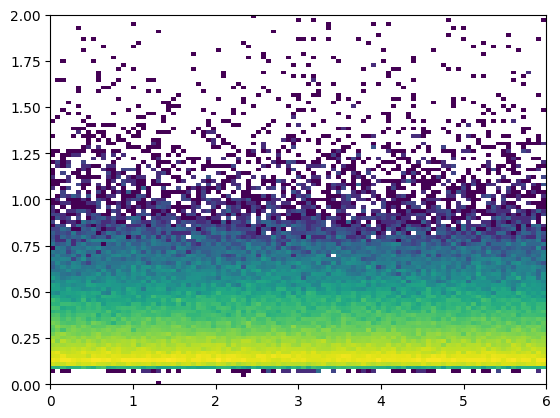

In [73]:
plt.hist2d(df_MCLabelsLeading.PrimaryAzimuth,df_DNN_energy_bigger_conv.bundle_energy_at_entry_log_uncertainty,bins=[np.linspace(0,6,100),np.linspace(0,2,100)],norm='log')

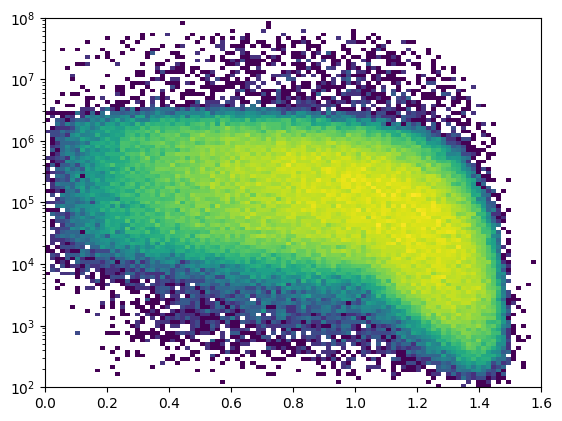

In [74]:
plt.hist2d(df_MCLabelsLeading.PrimaryZenith,df_MCLabelsLeading.bundle_energy_at_entry,norm='log',bins=[np.linspace(0,1.6,100),np.logspace(2,8,100)])
plt.yscale('log')

In [75]:
double_cut_s_bias=df_DNN_energy_s_bias[mask2]
double_cut_bigger_max=df_DNN_energy_bigger_max[mask2]
double_cut_Parent=df_MCLabelsParent[mask2]
double_cut_Corsika=CorsikaWeightMap[mask2]
double_cut_Leading=df_MCLabelsLeading[mask2]
np.size(double_cut_Leading.entry_energy)/np.size(df_MCLabelsLeading.entry_energy)

0.8651453021929043

In [76]:
double_cut_bigger_max2=df_DNN_energy_bigger_max[mask3]
double_cut_Parent2=df_MCLabelsParent[mask3]
double_cut_Corsika2=CorsikaWeightMap[mask3]
double_cut_Leading2=df_MCLabelsLeading[mask3]
print(np.size(double_cut_Leading2.entry_energy)/np.size(df_MCLabelsLeading.entry_energy))

0.9967603086875685


(3.1622776601683794e-11, 0.0031622776601683794)

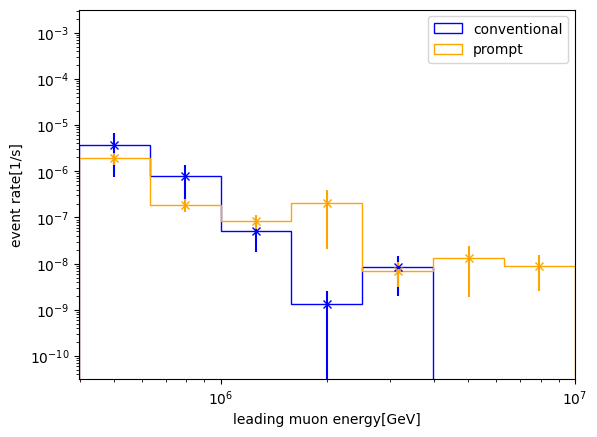

In [77]:
prompt_conventional_flux_entry(np.logspace(5.6,7,8),double_cut_Leading,double_cut_Parent,double_cut_Corsika.simweights_GaisserH3a)
plt.ylim([10**(-10.5),10**(-2.5)])

<ErrorbarContainer object of 3 artists>

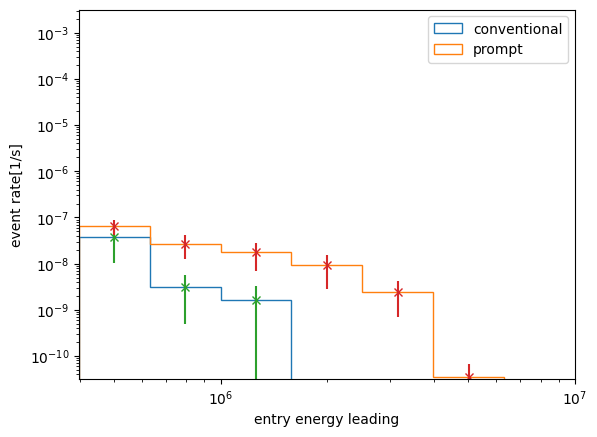

In [78]:
b3=np.logspace(5.6,7,8)
plt.hist(double_cut_bigger_max.bundle_energy_at_entry[double_cut_Parent.is_prompt_dennis==0]*double_cut_s_bias.leading_energy_rel_entry[double_cut_Parent.is_prompt_dennis==0],bins=b3,histtype='step', log=True, label='conventional', weights=double_cut_Corsika.simweights_GaisserH3a[double_cut_Parent.is_prompt_dennis==0])
plt.hist(double_cut_bigger_max.bundle_energy_at_entry[double_cut_Parent.is_prompt_dennis==1]*double_cut_s_bias.leading_energy_rel_entry[double_cut_Parent.is_prompt_dennis==1], bins=b3, histtype='step',log=True,label='prompt',weights=double_cut_Corsika.simweights_GaisserH3a[double_cut_Parent.is_prompt_dennis==1])
#plt.hist(double_cut_bigger_max.bundle_energy_at_entry[double_cut_Parent.is_prompt_dennis==0]*double_cut_s_bias.leading_energy_rel_entry[double_cut_Parent.is_prompt_dennis==0],bins=b3,histtype='step', log=True, label='conventional')
#plt.hist(double_cut_bigger_max.bundle_energy_at_entry[double_cut_Parent.is_prompt_dennis==1]*double_cut_s_bias.leading_energy_rel_entry[double_cut_Parent.is_prompt_dennis==1], bins=b3, histtype='step',log=True,label='prompt')
plt.xscale('log')
plt.xlim([10**5.6,10**7])
plt.ylim([10**(-10.5),10**(-2.5)])
plt.xlabel('entry energy leading')
plt.ylabel('event rate[1/s]')
plt.legend()
errors_conventional, error_edges_conventional=bh.numpy.histogram(double_cut_bigger_max.bundle_energy_at_entry[double_cut_Parent.is_prompt_dennis==0]*double_cut_s_bias.leading_energy_rel_entry[double_cut_Parent.is_prompt_dennis==0],bins=b3,weights=double_cut_Corsika.simweights_GaisserH3a[double_cut_Parent.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(double_cut_bigger_max.bundle_energy_at_entry[double_cut_Parent.is_prompt_dennis==1]*double_cut_s_bias.leading_energy_rel_entry[double_cut_Parent.is_prompt_dennis==1],bins=b3,weights=double_cut_Corsika.simweights_GaisserH3a[double_cut_Parent.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(double_cut_bigger_max.bundle_energy_at_entry[double_cut_Parent.is_prompt_dennis==0]*double_cut_s_bias.leading_energy_rel_entry[double_cut_Parent.is_prompt_dennis==0],bins=b3, weights=double_cut_Corsika.simweights_GaisserH3a[double_cut_Parent.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(double_cut_bigger_max.bundle_energy_at_entry[double_cut_Parent.is_prompt_dennis==1]*double_cut_s_bias.leading_energy_rel_entry[double_cut_Parent.is_prompt_dennis==1],bins=b3, weights=double_cut_Corsika.simweights_GaisserH3a[double_cut_Parent.is_prompt_dennis==1])
mids=10**(np.log10(b3)[:(np.size(b3)-1)]+np.diff(np.log10(b3))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x')
#prompt_conventional_flux_entry(np.logspace(5,7,8),double_cut_Leading,double_cut_Parent,double_cut_Corsika.simweights_GlobalFitGST)
#prompt_conventional_flux_entry(np.logspace(5,7,8))

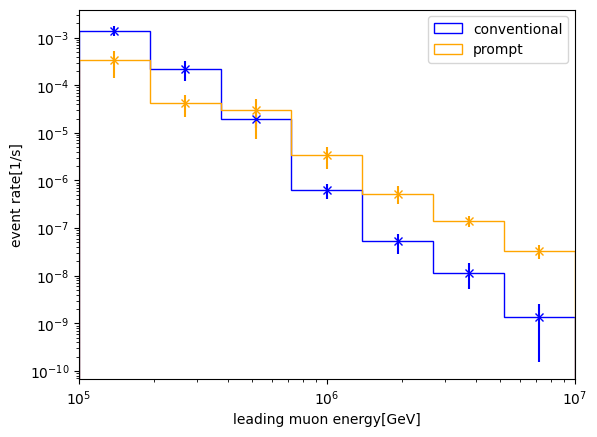

In [79]:
prompt_conventional_flux_entry(np.logspace(5,7,8),double_cut_Leading2,double_cut_Parent2,double_cut_Corsika2.simweights_GaisserH3a)

<ErrorbarContainer object of 3 artists>

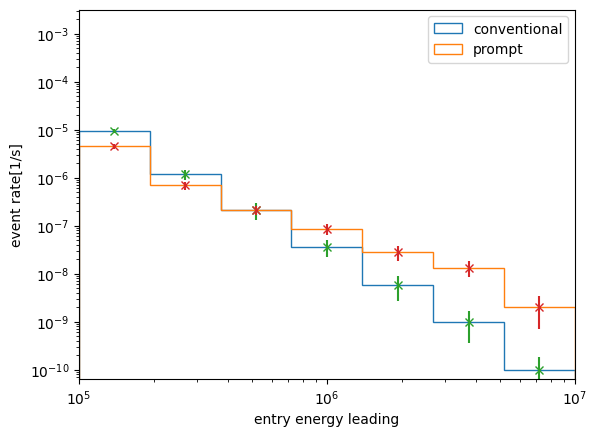

In [80]:
plt.hist(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==0]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==0])
plt.hist(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==1]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt',weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==1])
plt.xscale('log')
plt.xlim([10**5,10**7])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.xlabel('entry energy leading')
plt.ylabel('event rate[1/s]')
plt.legend()
errors_conventional, error_edges_conventional=bh.numpy.histogram(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==0]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==0],bins=b,weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==1]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==1],bins=b,weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==0]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==0],bins=b, weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==1]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==1],bins=b, weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==1])
mids=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x')

In [81]:
print(np.size((double_cut_s_bias.leading_energy_rel_entry*double_cut_bigger_max.bundle_energy_at_entry)[double_cut_s_bias.leading_energy_rel_entry*double_cut_bigger_max.bundle_energy_at_entry>=10**5])/np.size(double_cut_Leading.entry_energy[double_cut_Leading.entry_energy>=10**5]))

0.28091603053435116


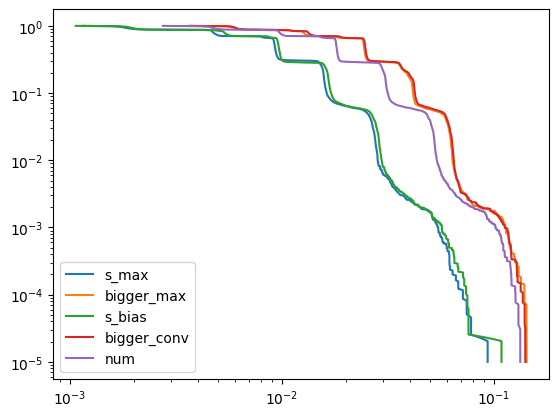

In [82]:
#p=np.linspace(0,1,1000)
p2=np.logspace(-5,0,1000)
plt.plot(np.quantile(df_DNN_energy_s_max.runtime_prediction,1-p2),p2,label='s_max')
plt.plot(np.quantile(df_DNN_energy_bigger_max.runtime_prediction,1-p2),p2,label='bigger_max')
plt.plot(np.quantile(df_DNN_energy_s_bias.runtime_prediction,1-p2),p2,label='s_bias')
plt.plot(np.quantile(df_DNN_energy_bigger_conv.runtime_prediction,1-p2),p2,label='bigger_conv')
plt.plot(np.quantile(df_DNN_energy_num.runtime_prediction,1-p2),p2,label='num')
plt.xscale('log')
plt.yscale('log')
plt.legend()

In [83]:
print(np.median(df_DNN_energy_s_max.runtime_prediction))
print(np.median(df_DNN_energy_bigger_conv.runtime_prediction))
print(np.median(df_DNN_energy_s_bias.runtime_prediction))
print(np.median(df_DNN_energy_s.runtime_prediction))
print(np.median(df_DNN_energy_bigger_max.runtime_prediction))
print(np.median(df_DNN_energy_num.runtime_prediction))
print(np.median(df_DNN_energy.runtime_prediction/df_DNN_energy_s.runtime_prediction))
print(np.median(df_DNN_energy_s_bias.runtime_prediction/df_DNN_energy_s_max.runtime_prediction))


0.009246551722753793
0.02469353299238719
0.009631405584514141
0.00964569445932284
0.024379692098591477
0.018054518569260835
1.8818558585590572
1.0485750286696778


In [84]:
bigger_max_dir,MCLeading_dir,Corsika_dir,Parent_dir=cut(df_MCLabelsLeading.PrimaryZenith<=0.25,df_DNN_energy_bigger_max,1,1)

fraction total cut: 0.02900440618393908
fraction prompt cut: 0.03617516395176645
fraction entry prompt over 10**5: 0.04773869346733668
fraction bundle prompt over 10**5: 0.045481393975191964


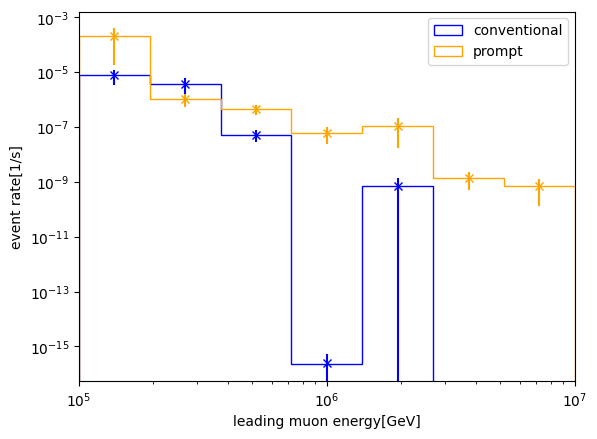

In [85]:
prompt_conventional_flux_entry(np.logspace(5,7,8),MCLeading_dir,Parent_dir,Corsika_dir.simweights_GaisserH3a)

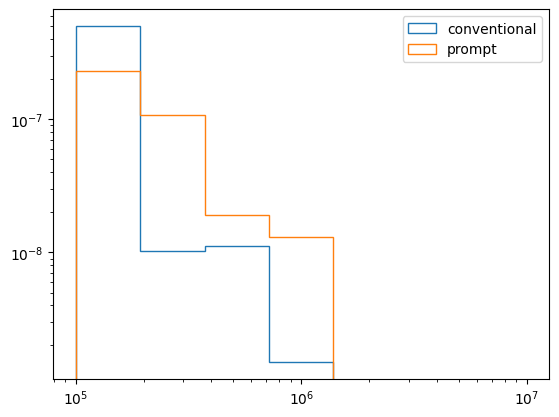

In [86]:
plt.hist(bigger_max_dir.leading_energy_rel_entry[Parent_dir.is_prompt_dennis==0]*bigger_max_dir.bundle_energy_at_entry[Parent_dir.is_prompt_dennis==0],bins=np.logspace(5,7,8),log=True,weights=Corsika_dir.simweights_GaisserH3a[Parent_dir.is_prompt_dennis==0],histtype='step',label='conventional')
plt.hist(bigger_max_dir.leading_energy_rel_entry[Parent_dir.is_prompt_dennis==1]*bigger_max_dir.bundle_energy_at_entry[Parent_dir.is_prompt_dennis==1],bins=np.logspace(5,7,8),log=True,weights=Corsika_dir.simweights_GaisserH3a[Parent_dir.is_prompt_dennis==1],histtype='step',label='prompt')
plt.xscale('log')
plt.legend()

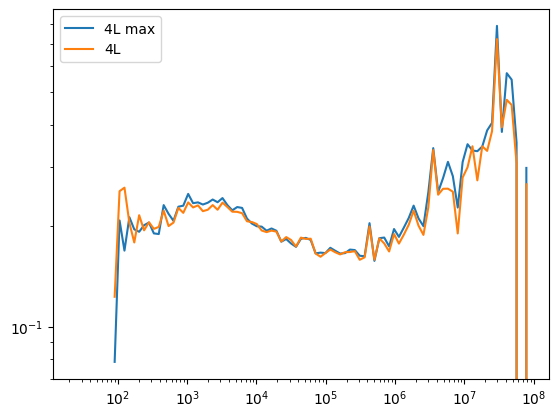

In [87]:
bundle_resolution_bigger_max,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_max.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
#plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_bigger_max,label='12L max')
bundle_resolution_bigger_conv,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_conv.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
#plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_bigger_conv,label='12L')
bundle_resolution_s_max,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_s_max.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_s_max,label='4L max')
bundle_resolution_num,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_num.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
#plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_num,label='num')
bundle_resolution_s_bias,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_s_bias.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
#plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_s_bias,label='s_bias')
bundle_resolution_s,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_s.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_s,label='4L')
bundle_resolution,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
#plt.plot(mid(np.logspace(1,8,100)),bundle_resolution,label='8L')
#plt.plot(mid(np.logspace(1,8,100)),np.ones(99)*np.mean(bundle_resolution))
plt.xscale('log')
plt.yscale('log')
#print(np.nanmean(bundle_resolution))
#entry_resolution_bigger_max,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.entry_energy,np.log10(df_DNN_energy_bigger_max.entry_energy),bins=np.logspace(1,7,100),statistic=np.nanstd)
#plt.plot(mid(np.logspace(1,7,100)),entry_resolution_bigger_max,label='bigger_max')
plt.legend()

/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


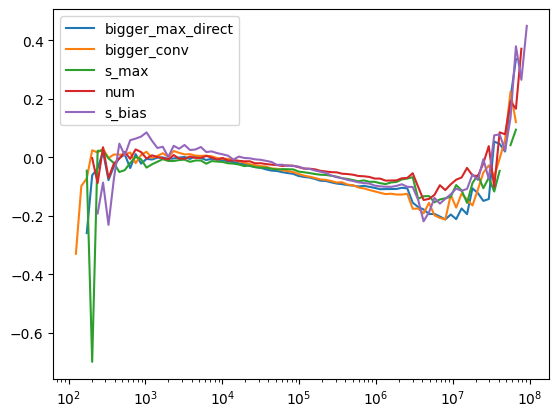

In [88]:
bundle_bias_bigger_max,bins,digitized=scp.stats.binned_statistic(df_DNN_energy_bigger_max.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_max.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmedian)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_bigger_max,label='bigger_max_direct')
bundle_bias_bigger_conv,bins,digitized=scp.stats.binned_statistic(df_DNN_energy_bigger_conv.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_conv.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmedian)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_bigger_conv,label='bigger_conv')
bundle_bias_s_max,bins,digitized=scp.stats.binned_statistic(df_DNN_energy_s_max.bundle_energy_at_entry,np.log10(df_DNN_energy_s_max.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmedian)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_s_max,label='s_max')
bundle_bias_num,bins,digitized=scp.stats.binned_statistic(df_DNN_energy_num.bundle_energy_at_entry,np.log10(df_DNN_energy_num.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmedian)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_num,label='num')
bundle_bias_s_bias,bins,digitized=scp.stats.binned_statistic(df_DNN_energy_s_bias.bundle_energy_at_entry,np.log10(df_DNN_energy_s_bias.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmedian)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_s_bias,label='s_bias')
plt.xscale('log')
plt.legend()

/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


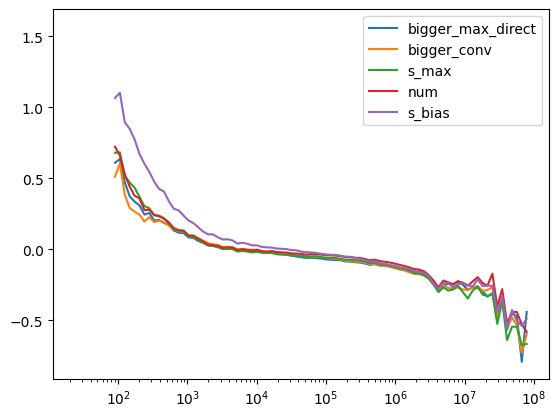

In [89]:
bundle_bias_bigger_max,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_max.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_bigger_max,label='bigger_max_direct')
bundle_bias_bigger_conv,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_conv.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_bigger_conv,label='bigger_conv')
bundle_bias_s_max,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_s_max.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_s_max,label='s_max')
bundle_bias_num,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_num.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_num,label='num')
bundle_bias_s_bias,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_s_bias.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,8,100)),bundle_bias_s_bias,label='s_bias')
plt.xscale('log')
plt.legend()

/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


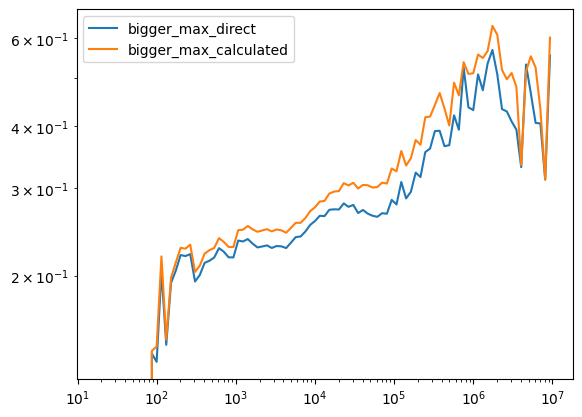

In [90]:
entry_resolution_bigger_max_direct,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.entry_energy,np.log10(df_DNN_energy_bigger_max.entry_energy),bins=np.logspace(1,7,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(1,7,100)),entry_resolution_bigger_max_direct,label='bigger_max_direct')
entry_resolution_bigger_max_calc,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.entry_energy,np.log10(df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry),bins=np.logspace(1,7,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(1,7,100)),entry_resolution_bigger_max_calc,label='bigger_max_calculated')
plt.xscale('log')
plt.yscale('log')
plt.legend()

/scratch/lflottau/lf/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


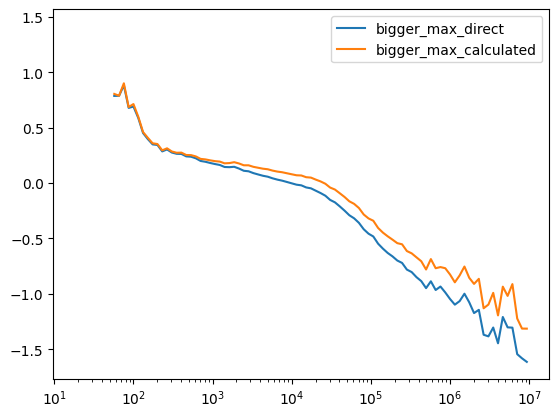

In [91]:
entry_bias_bigger_max_direct,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.entry_energy,np.log10(df_DNN_energy_bigger_max.entry_energy)-np.log10(df_MCLabelsLeading.entry_energy),bins=np.logspace(1,7,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,7,100)),entry_bias_bigger_max_direct,label='bigger_max_direct')
entry_bias_bigger_max_calc,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.entry_energy,np.log10(df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry)-np.log10(df_MCLabelsLeading.entry_energy),bins=np.logspace(1,7,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(1,7,100)),entry_bias_bigger_max_calc,label='bigger_max_calculated')
plt.xscale('log')
plt.legend()

0.14050399557963425


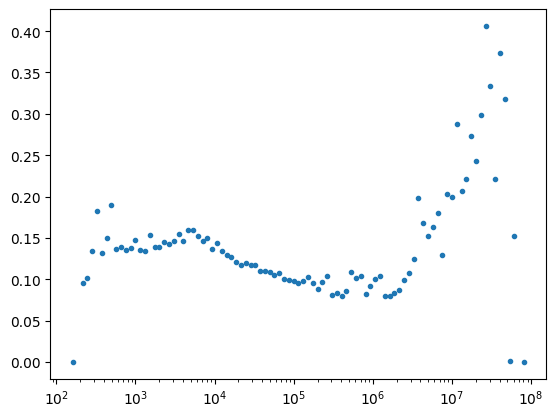

In [92]:
bundle_resolution_cut_b,bins,digitized=scp.stats.binned_statistic(bundle_energy_true_cut_b.bundle_energy_at_entry,np.log10(bundle_energy_pred_cut_b.bundle_energy_at_entry),bins=np.logspace(2,8,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(2,8,100)),bundle_resolution_cut_b,'.')
#plt.plot(mid(np.logspace(1,8,100)),np.ones(99)*np.mean(bundle_resolution))
plt.xscale('log')
print(np.nanmean(bundle_resolution_cut_b))

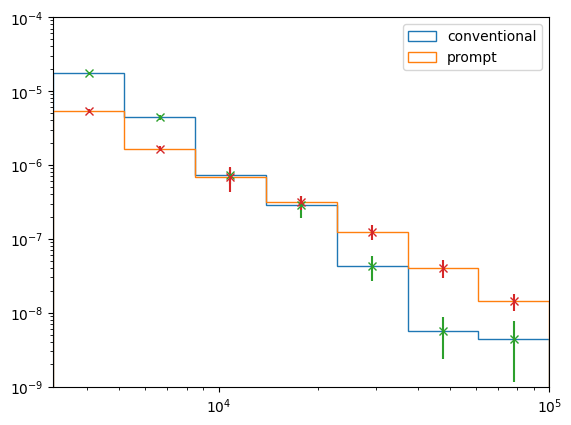

In [93]:
bins_num2=np.logspace(3.5,5,8)
plt.hist(df_MCLabelsLeading.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=np.logspace(3.5,5,8),weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0],histtype='step',label='conventional')
plt.hist(df_MCLabelsLeading.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=np.logspace(3.5,5,8),weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1],histtype='step',label='prompt')
plt.xscale('log')
plt.yscale('log')
plt.xlim(10**3.5,10**5)
plt.ylim(10**(-9),10**(-4))
errors_conventional, error_edges_conventional=bh.numpy.histogram(df_MCLabelsLeading.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=bins_num2,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(df_MCLabelsLeading.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=bins_num2,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(df_MCLabelsLeading.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=bins_num2, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(df_MCLabelsLeading.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=bins_num2, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1])
mids=10**(np.log10(bins_num2)[:(np.size(bins_num2)-1)]+np.diff(np.log10(bins_num2))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x')
plt.legend()

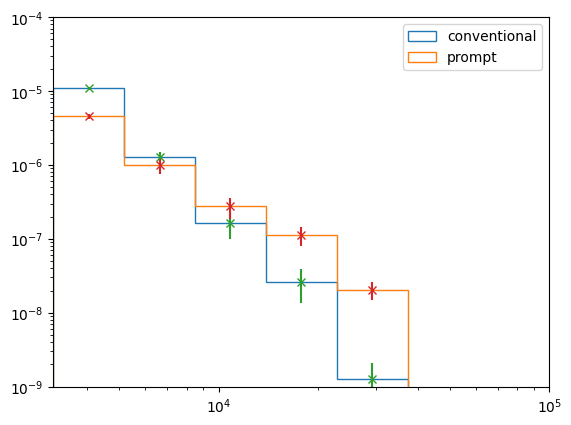

In [94]:
plt.hist(df_DNN_energy_bigger_max.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=np.logspace(3.5,5,8),weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0],histtype='step',label='conventional')
plt.hist(df_DNN_energy_bigger_max.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=np.logspace(3.5,5,8),weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1],histtype='step',label='prompt')
plt.xscale('log')
plt.yscale('log')
plt.xlim(10**3.5,10**5)
plt.ylim(10**(-9),10**(-4))
errors_conventional, error_edges_conventional=bh.numpy.histogram(df_DNN_energy_bigger_max.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=bins_num2,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(df_DNN_energy_bigger_max.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=bins_num2,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(df_DNN_energy_bigger_max.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=bins_num2, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(df_DNN_energy_bigger_max.num_muons_at_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=bins_num2, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1])
mids=10**(np.log10(bins_num2)[:(np.size(bins_num2)-1)]+np.diff(np.log10(bins_num2))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x')
plt.legend()

(6.309573444801942e-11, 0.0031622776601683794)

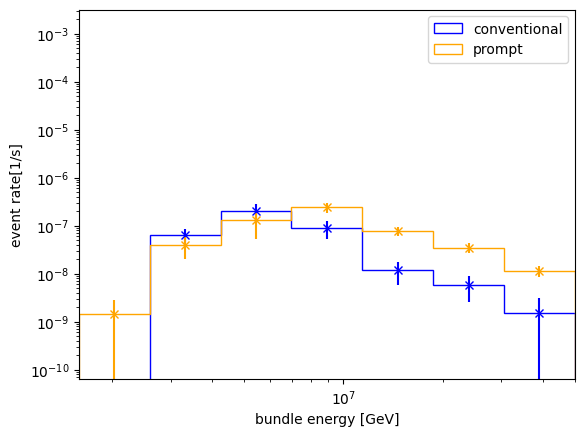

In [95]:
num_mask=df_MCLabelsLeading.num_muons_at_entry>=13000
num_mask2=df_DNN_energy_bigger_max.num_muons_at_entry>=7000
prompt_conventional_flux_bundle(np.logspace(6.2,7.7,8),df_MCLabelsLeading[num_mask2],df_MCLabelsParent[num_mask2],CorsikaWeightMap.simweights_GaisserH3a[num_mask2])
plt.ylim([10**(-10.2),10**(-2.5)])

(6.309573444801942e-11, 0.0031622776601683794)

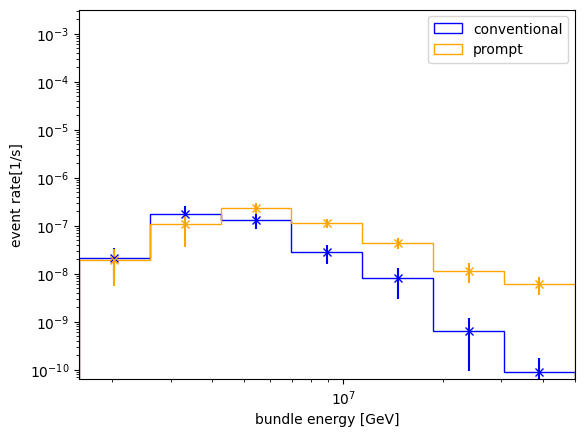

In [96]:
prompt_conventional_flux_bundle(np.logspace(6.2,7.7,8),df_DNN_energy_bigger_max[num_mask2],df_MCLabelsParent[num_mask2],CorsikaWeightMap.simweights_GaisserH3a[num_mask2])
plt.ylim([10**(-10.2),10**(-2.5)])

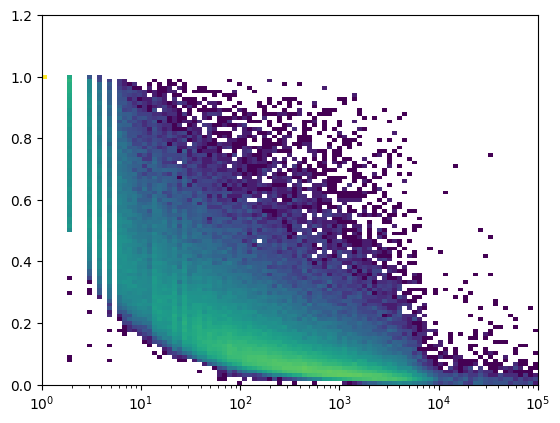

In [97]:
plt.hist2d(df_MCLabelsLeading.num_muons_at_entry,df_MCLabelsLeading.leading_energy_rel_entry,norm='log',bins=[np.logspace(0,5,100),np.linspace(0,1.2,100)],range=[(1,10**5),(0,1.2)])
plt.xscale('log')

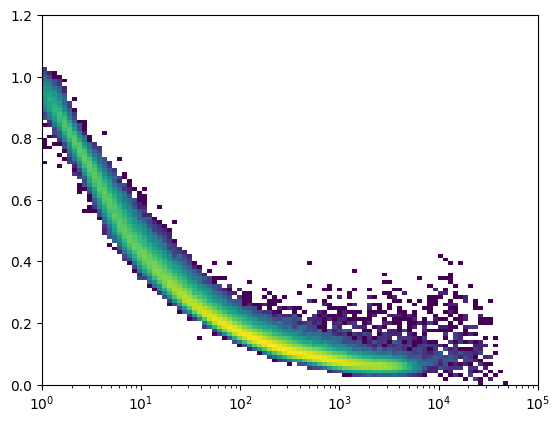

In [98]:
plt.hist2d(df_DNN_energy_bigger_max.num_muons_at_entry,df_DNN_energy_bigger_max.leading_energy_rel_entry,norm='log',bins=[np.logspace(0,5,100),np.linspace(0,1.2,100)],range=[(1,10**5),(0,1.2)])
plt.xscale('log')

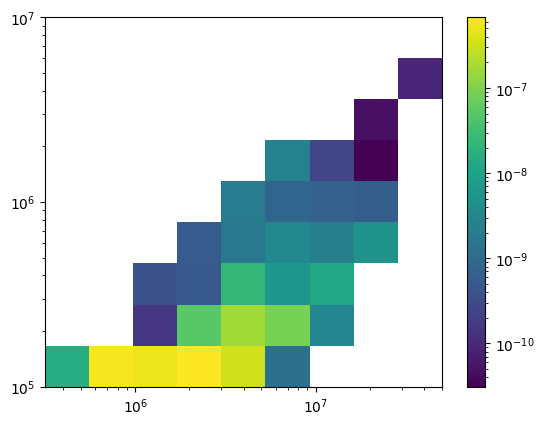

In [99]:
plt.hist2d(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0],df_DNN_energy_bigger_max.entry_energy[df_MCLabelsParent.is_prompt_dennis==0],norm='log',bins=[np.logspace(5.5,7.7,10),np.logspace(5,7,10)],range=[(10**5.5,10**7.7),(10**5,10**7)],weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0],cmin=10**(-12))
plt.xscale('log')
plt.yscale('log')
plt.colorbar()

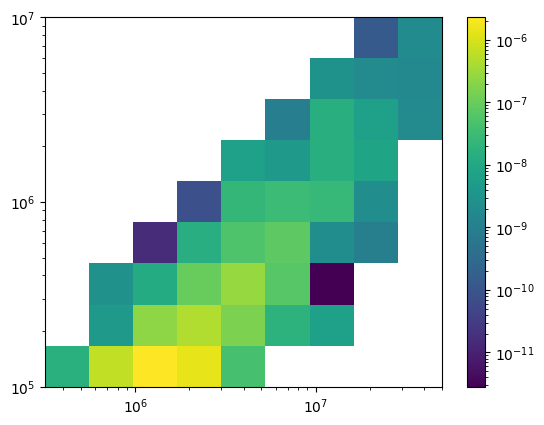

In [100]:
plt.hist2d(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1],df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],norm='log',bins=[np.logspace(5.5,7.7,10),np.logspace(5,7,10)],range=[(10**5.5,10**7.7),(10**5,10**7)],weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1],cmin=10**(-12))
plt.xscale('log')
plt.yscale('log')
plt.colorbar()

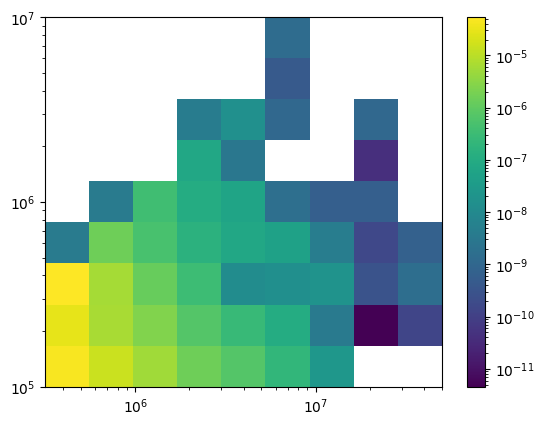

In [101]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0],df_MCLabelsLeading.entry_energy[df_MCLabelsParent.is_prompt_dennis==0],norm='log',bins=[np.logspace(5.5,7.7,10),np.logspace(5,7,10)],range=[(10**5.5,10**7.7),(10**5,10**7)],weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0],cmin=10**(-12))
plt.xscale('log')
plt.yscale('log')
plt.colorbar()

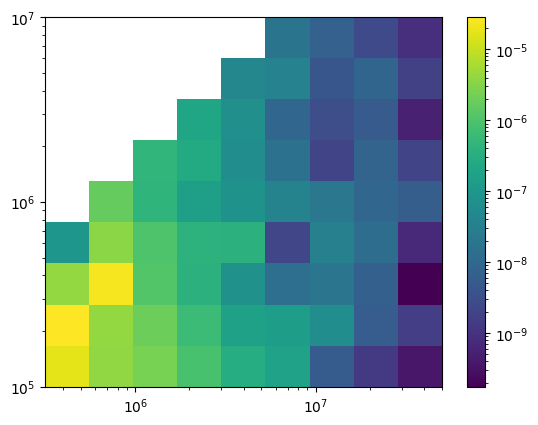

In [102]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1],df_MCLabelsLeading.entry_energy[df_MCLabelsParent.is_prompt_dennis==1],norm='log',bins=[np.logspace(5.5,7.7,10),np.logspace(5,7,10)],range=[(10**5.5,10**7.7),(10**5,10**7)],weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1],cmin=10**(-12))
plt.xscale('log')
plt.yscale('log')
plt.colorbar()

5716666.5019136155


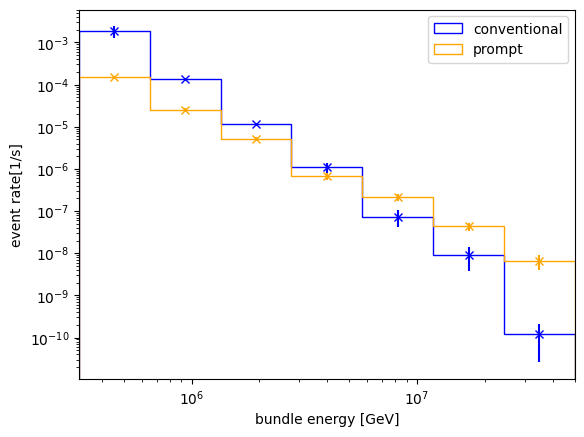

In [103]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_bigger_max,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
print(np.logspace(5.5,7.7,8)[4])

(6.309573444801942e-11, 0.0031622776601683794)

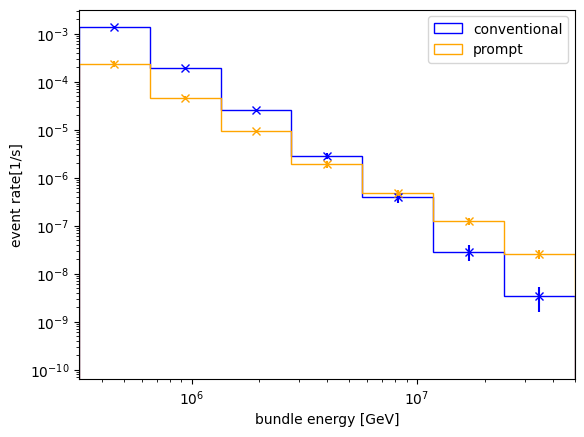

In [104]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])

(6.309573444801942e-11, 0.0031622776601683794)

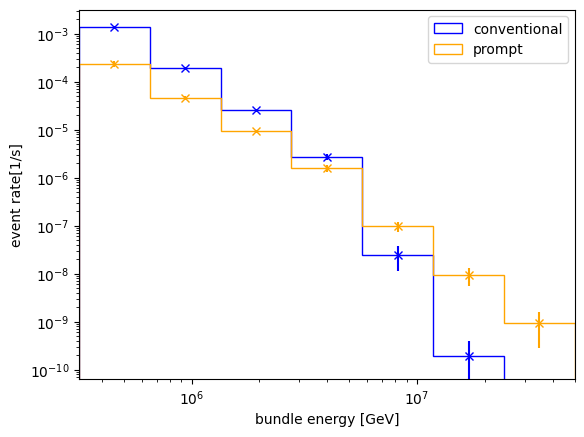

In [105]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading[df_MCLabelsLeading.num_muons_at_entry<10**4],df_MCLabelsParent[df_MCLabelsLeading.num_muons_at_entry<10**4],CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsLeading.num_muons_at_entry<10**4])
plt.ylim([10**(-10.2),10**(-2.5)])

(6.309573444801942e-11, 0.0031622776601683794)

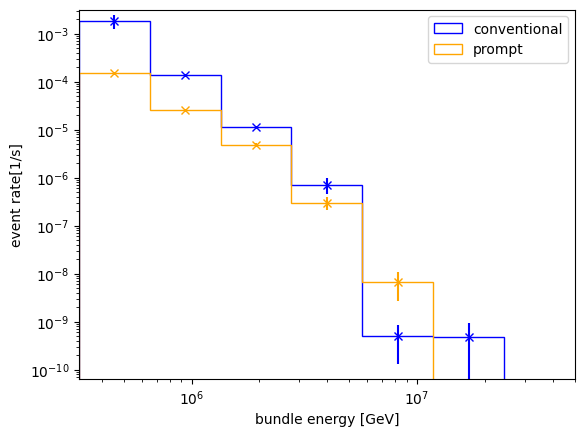

In [106]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_bigger_max[df_DNN_energy_bigger_max.num_muons_at_entry<10**3.8],df_MCLabelsParent[df_DNN_energy_bigger_max.num_muons_at_entry<10**3.8],CorsikaWeightMap.simweights_GaisserH3a[df_DNN_energy_bigger_max.num_muons_at_entry<10**3.8])
plt.ylim([10**(-10.2),10**(-2.5)])

In [107]:
#print(np.mean(df_DNN_energy_bigger_max.num_muons_at_entry[np.all([df_MCLabelsLeading.bundle_energy_at_entry>=10**6.5,df_MCLabelsParent.is_prompt_dennis==0],axis=0)]))
#print(np.mean(df_DNN_energy_bigger_max.num_muons_at_entry[np.all([df_MCLabelsLeading.bundle_energy_at_entry>=10**6.5,df_MCLabelsParent.is_prompt_dennis==1],axis=0)]))
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5.5,7.7,8)[4],df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5,7,8)[4],df_MCLabelsParent.is_prompt_dennis==0],axis=0)]))
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5.5,7.7,8)[4],df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5,7,8)[4],df_MCLabelsParent.is_prompt_dennis==1],axis=0)]))
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5.5,7.7,8)[4],df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5,7,8)[4],df_MCLabelsParent.is_prompt_dennis==1],axis=0)])/np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5.5,7.7)[4],df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5,7,8)[4]],axis=0)]))

1.2287304397199438e-08
5.5487247580997867e-08
0.8050532009330496


In [108]:
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5.5,7.7,8)[4],df_MCLabelsParent.is_prompt_dennis==0],axis=0)]))
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5.5,7.7,8)[4],df_MCLabelsParent.is_prompt_dennis==1],axis=0)]))
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5.5,7.7,8)[4],df_MCLabelsParent.is_prompt_dennis==1],axis=0)])/np.sum(CorsikaWeightMap.simweights_GaisserH3a[df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5.5,7.7,8)[4]]))

8.339980458831194e-08
2.671591222180823e-07
0.7620947629316205


In [109]:
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5,7,8)[4],df_MCLabelsParent.is_prompt_dennis==0],axis=0)]))
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5,7,8)[4],df_MCLabelsParent.is_prompt_dennis==1],axis=0)]))
print(np.sum(CorsikaWeightMap.simweights_GaisserH3a[np.all([df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5,7,8)[4],df_MCLabelsParent.is_prompt_dennis==1],axis=0)])/np.sum(CorsikaWeightMap.simweights_GaisserH3a[df_DNN_energy_bigger_max.leading_energy_rel_entry*df_DNN_energy_bigger_max.bundle_energy_at_entry>np.logspace(5,7,8)[4]]))

1.274830337707543e-08
5.617539944987891e-08
0.8150374565759707


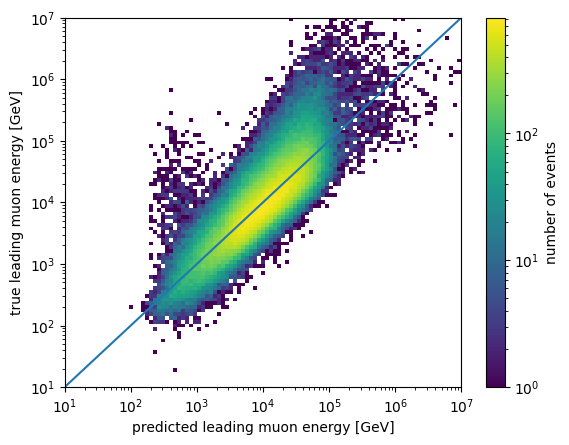

In [110]:
correlation_plot(df_DNN_leading,df_MCLabelsLeading,1,7,0)

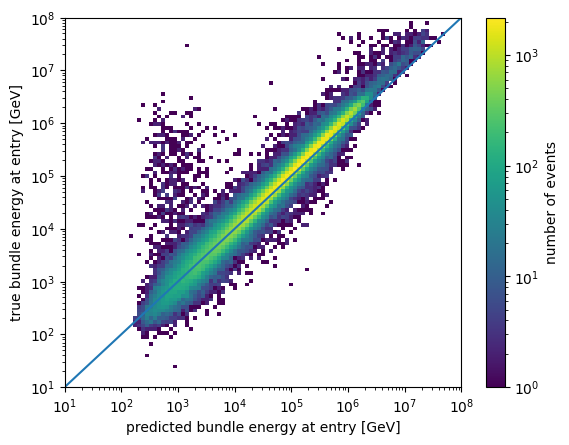

In [111]:
correlation_plot(df_DNN_bundle,df_MCLabelsLeading,1,8,1)

(6.309573444801942e-11, 0.0031622776601683794)

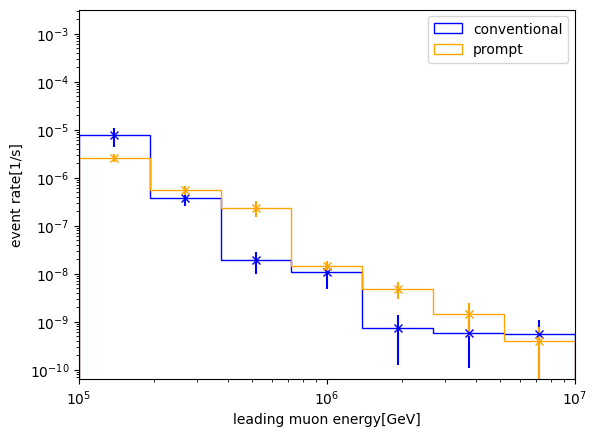

In [112]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_leading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])

(6.309573444801942e-11, 0.0031622776601683794)

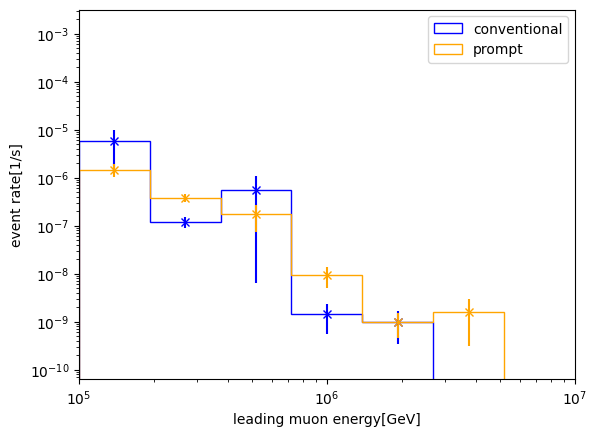

In [113]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy_s_max,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])

(6.309573444801942e-11, 0.0031622776601683794)

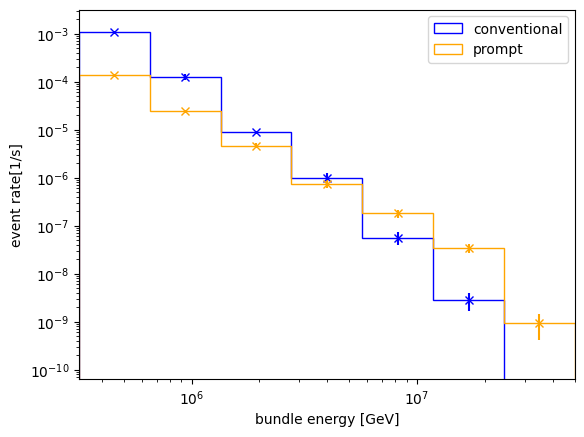

In [114]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_bundle,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])

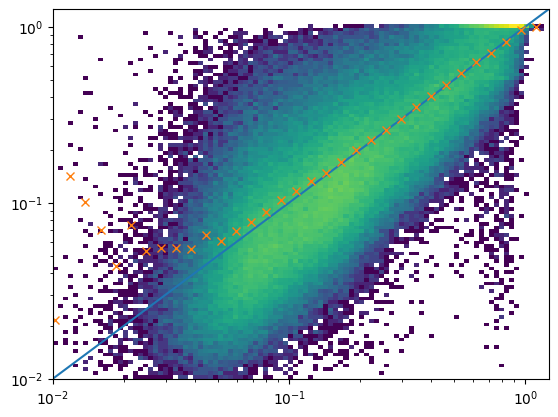

In [115]:
plt.hist2d(df_DNN_leading.leading_energy_rel_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=np.logspace(-2,0.1,100),norm='log')
plt.xscale('log')
plt.yscale('log')
plt.plot(np.logspace(-2,1.1,100),np.logspace(-2,1.1,100))
mean_rel, bins, digit=scp.stats.binned_statistic(df_DNN_leading.leading_energy_rel_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=np.logspace(-2,0.1,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(-2,0.1,100))[::3],mean_rel[::3],'x')

PearsonRResult(statistic=0.8507112257575898, pvalue=0.0)

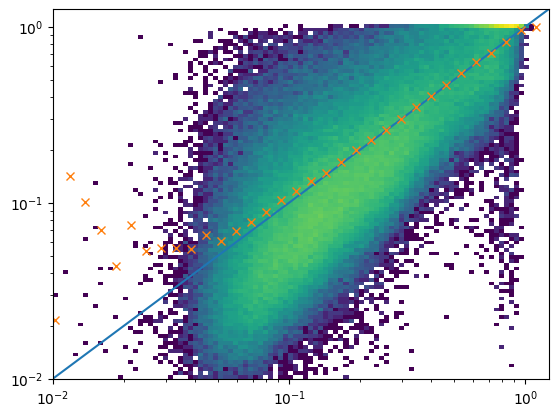

In [116]:
plt.hist2d(df_DNN_energy_s_max.leading_energy_rel_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=np.logspace(-2,0.1,100),norm='log')
plt.xscale('log')
plt.yscale('log')
plt.plot(np.logspace(-2,1.1,100),np.logspace(-2,1.1,100))
mean_rel, bins, digit=scp.stats.binned_statistic(df_DNN_leading.leading_energy_rel_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=np.logspace(-2,0.1,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(-2,0.1,100))[::3],mean_rel[::3],'x')
scp.stats.pearsonr(df_DNN_energy_s_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry)

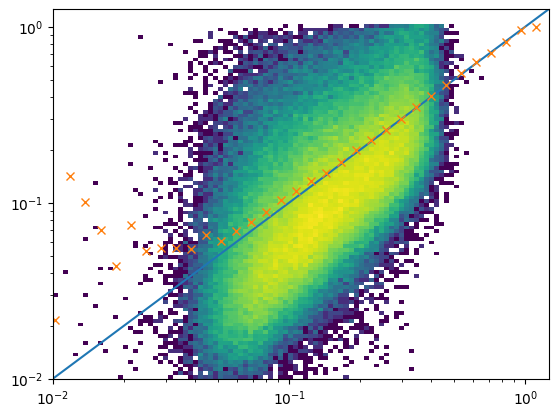

In [117]:
plt.hist2d(df_DNN_energy_s_max.leading_energy_rel_entry[df_DNN_energy_s_max.bundle_energy_at_entry>10**4],df_MCLabelsLeading.leading_energy_rel_entry[df_DNN_energy_s_max.bundle_energy_at_entry>10**4],bins=np.logspace(-2,0.1,100),norm='log')
plt.xscale('log')
plt.yscale('log')
plt.plot(np.logspace(-2,1.1,100),np.logspace(-2,1.1,100))
mean_rel, bins, digit=scp.stats.binned_statistic(df_DNN_leading.leading_energy_rel_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=np.logspace(-2,0.1,100),statistic=np.nanmean)
plt.plot(mid(np.logspace(-2,0.1,100))[::3],mean_rel[::3],'x')

<ErrorbarContainer object of 3 artists>

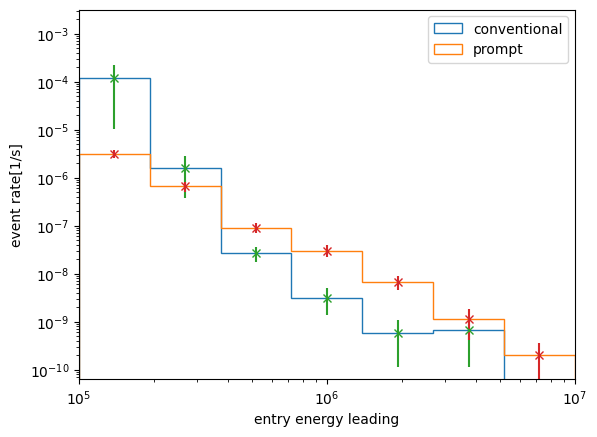

In [118]:
b=np.logspace(5,7,8)
plt.hist(df_DNN_energy_s_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_leading.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0])
plt.hist(df_DNN_energy_s_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_leading.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt',weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1])
plt.xscale('log')
plt.xlim([10**5,10**7])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.xlabel('entry energy leading')
plt.ylabel('event rate[1/s]')
plt.legend()
errors_conventional, error_edges_conventional=bh.numpy.histogram(df_DNN_energy_s_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_leading.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(df_DNN_energy_s_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_leading.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=b,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(df_DNN_energy_s_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_leading.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(df_DNN_energy_s_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_leading.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=b, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1])
mids=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x')

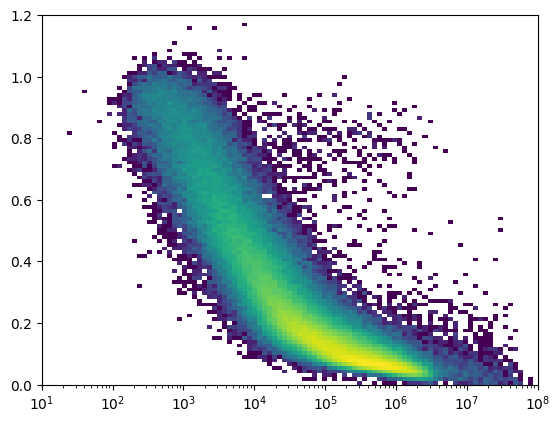

In [119]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry,df_DNN_leading.leading_energy_rel_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
plt.xscale('log')

PearsonRResult(statistic=0.8356025453812087, pvalue=0.0)
SignificanceResult(statistic=0.9825128768770847, pvalue=0.0)


/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


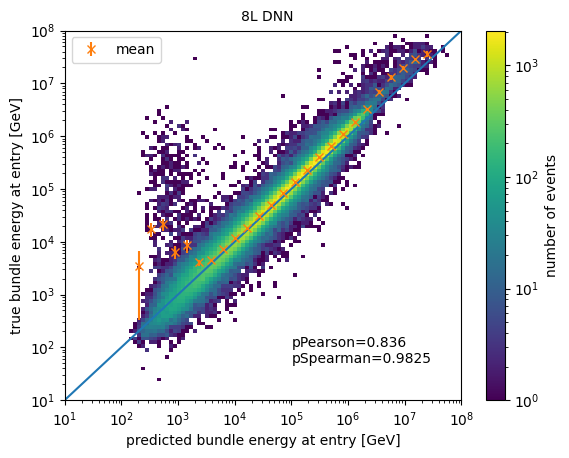

In [120]:
correlation_plot(df_DNN_energy,df_MCLabelsLeading,1,8,1)
print(scp.stats.pearsonr(df_DNN_energy.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
print(scp.stats.spearmanr(df_DNN_energy.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
add_mean_error_bundle(df_DNN_energy,df_MCLabelsLeading,np.logspace(1,8,100),3)
plt.figtext(0.4,0.9,'8L DNN')
plt.text(10**5,10**2,'pPearson=0.836')
plt.text(10**5,10**1.7,'pSpearman=0.9825')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_8L_bundle.pdf')

PearsonRResult(statistic=0.8588909759007612, pvalue=0.0)
SignificanceResult(statistic=0.9909434063373723, pvalue=0.0)


/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


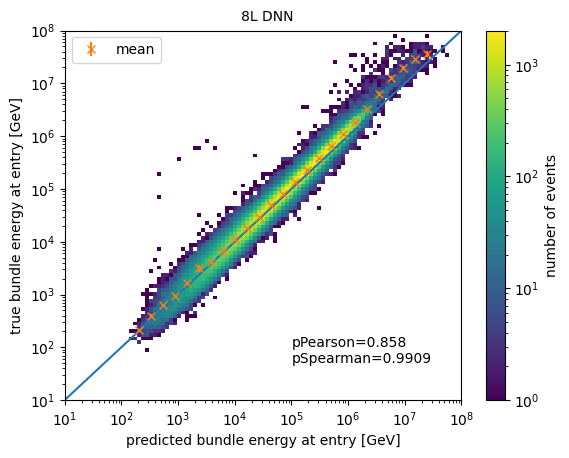

In [121]:
correlation_plot(df_DNN_energy[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsLeading[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],1,8,1)
print(scp.stats.pearsonr(df_DNN_energy.bundle_energy_at_entry[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsLeading.bundle_energy_at_entry[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5]))
print(scp.stats.spearmanr(df_DNN_energy.bundle_energy_at_entry[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsLeading.bundle_energy_at_entry[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5]))
add_mean_error_bundle(df_DNN_energy[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsLeading[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],np.logspace(1,8,100),3)
plt.figtext(0.4,0.9,'8L DNN')
plt.text(10**5,10**2,'pPearson=0.858')
plt.text(10**5,10**1.7,'pSpearman=0.9909')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_8L_bundle_cut.pdf')

PearsonRResult(statistic=0.824517633118049, pvalue=0.0)
SignificanceResult(statistic=0.9796278291899155, pvalue=0.0)


/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


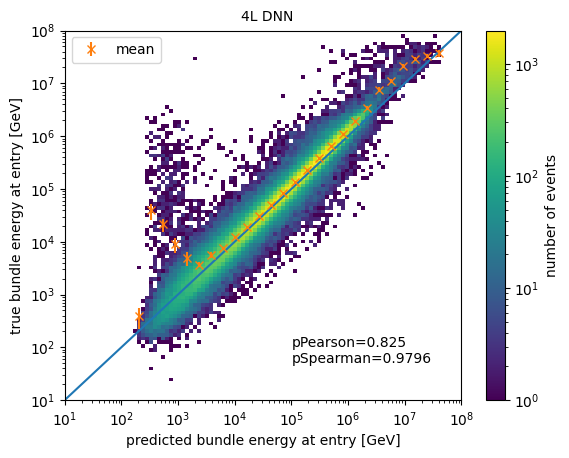

In [122]:
correlation_plot(df_DNN_energy_s,df_MCLabelsLeading,1,8,1)
print(scp.stats.pearsonr(df_DNN_energy_s.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
print(scp.stats.spearmanr(df_DNN_energy_s.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
add_mean_error_bundle(df_DNN_energy_s,df_MCLabelsLeading,np.logspace(1,8,100),3)
plt.figtext(0.4,0.9,'4L DNN')
plt.text(10**5,10**2,'pPearson=0.825')
plt.text(10**5,10**1.7,'pSpearman=0.9796')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_4L_bundle.pdf')

PearsonRResult(statistic=0.8469242158441415, pvalue=0.0)
SignificanceResult(statistic=0.9903397537225573, pvalue=0.0)


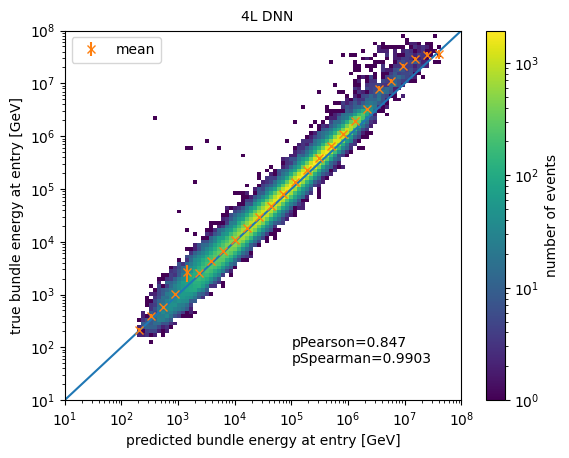

In [123]:
correlation_plot(df_DNN_energy_s[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsLeading[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],1,8,1)
print(scp.stats.pearsonr(df_DNN_energy_s.bundle_energy_at_entry[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsLeading.bundle_energy_at_entry[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5]))
print(scp.stats.spearmanr(df_DNN_energy_s.bundle_energy_at_entry[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsLeading.bundle_energy_at_entry[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5]))
add_mean_error_bundle(df_DNN_energy_s[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsLeading[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],np.logspace(1,8,100),3)
plt.figtext(0.4,0.9,'4L DNN')
plt.text(10**5,10**2,'pPearson=0.847')
plt.text(10**5,10**1.7,'pSpearman=0.9903')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_4L_bundle_cut.pdf')

In [124]:
print(np.size(df_DNN_energy_s.bundle_energy_at_entry[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5])/np.size(df_DNN_energy_s.bundle_energy_at_entry))
print(np.size(df_DNN_energy.bundle_energy_at_entry[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5])/np.size(df_DNN_energy.bundle_energy_at_entry))

0.8487991238570665
0.8718335328426253


PearsonRResult(statistic=0.8729219733748749, pvalue=0.0)
SignificanceResult(statistic=0.9852191278599768, pvalue=0.0)


/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Text(100000, 50.11872336272722, 'pSpearman=0.9852')

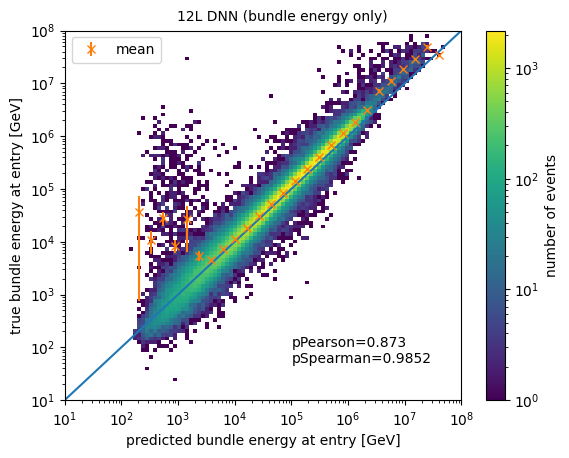

In [125]:
correlation_plot(df_DNN_bundle,df_MCLabelsLeading,1,8,1)
print(scp.stats.pearsonr(df_DNN_bundle.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
print(scp.stats.spearmanr(df_DNN_bundle.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
add_mean_error_bundle(df_DNN_bundle,df_MCLabelsLeading,np.logspace(1,8,100),3)
plt.figtext(0.3,0.9,'12L DNN (bundle energy only)')
plt.text(10**5,10**2,'pPearson=0.873')
plt.text(10**5,10**1.7,'pSpearman=0.9852')

PearsonRResult(statistic=0.8507112257575898, pvalue=0.0)
SignificanceResult(statistic=0.9796392065687602, pvalue=0.0)


/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Text(100000, 50.11872336272722, 'pSpearman=0.9796')

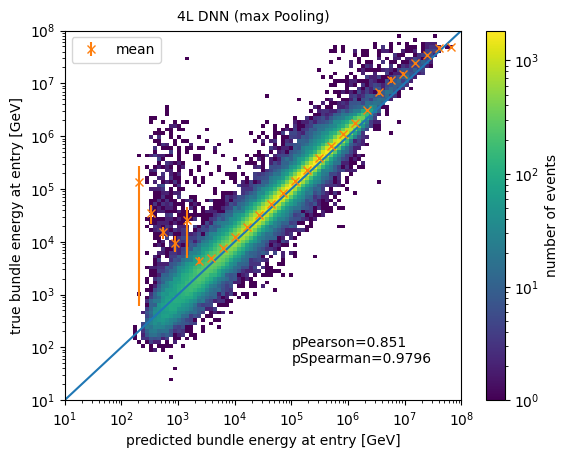

In [126]:
correlation_plot(df_DNN_energy_s_max,df_MCLabelsLeading,1,8,1)
print(scp.stats.pearsonr(df_DNN_energy_s_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
print(scp.stats.spearmanr(df_DNN_energy_s_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
add_mean_error_bundle(df_DNN_energy_s_max,df_MCLabelsLeading,np.logspace(1,8,100),3)
plt.figtext(0.3,0.9,'4L DNN (max Pooling)')
plt.text(10**5,10**2,'pPearson=0.851')
plt.text(10**5,10**1.7,'pSpearman=0.9796')

PearsonRResult(statistic=0.7220531215883288, pvalue=0.0)
SignificanceResult(statistic=0.9843267114838745, pvalue=0.0)


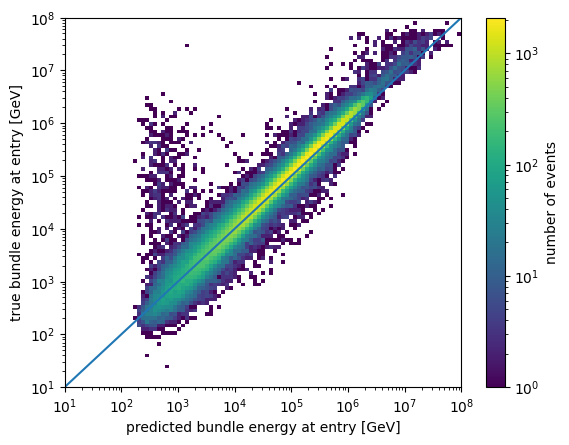

In [127]:
correlation_plot(df_DNN_energy_bigger_max,df_MCLabelsLeading,1,8,1)
print(scp.stats.pearsonr(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
print(scp.stats.spearmanr(df_DNN_energy_bigger_max.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))

PearsonRResult(statistic=0.854730528592975, pvalue=0.0)
SignificanceResult(statistic=0.9850673971284337, pvalue=0.0)


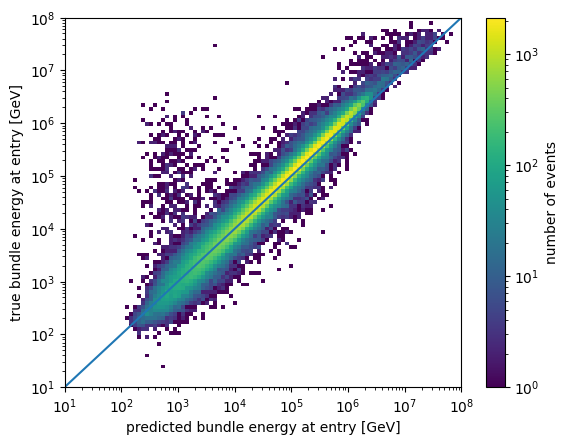

In [128]:
correlation_plot(df_DNN_energy_bigger_conv,df_MCLabelsLeading,1,8,1)
print(scp.stats.pearsonr(df_DNN_energy_bigger_conv.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))
print(scp.stats.spearmanr(df_DNN_energy_bigger_conv.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry))

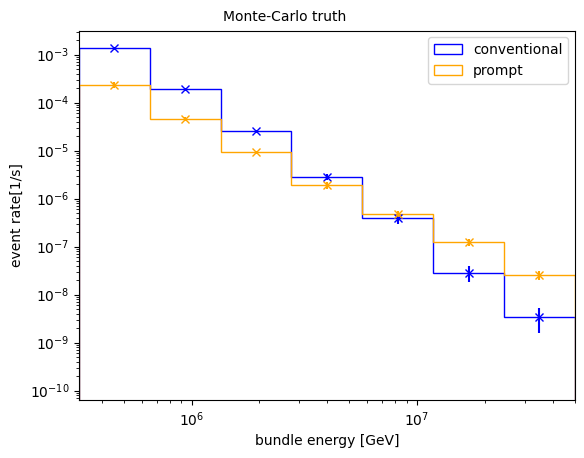

In [129]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.35,0.9,'Monte-Carlo truth')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/spectrum_MC_bundle.pdf')

Text(0.35, 0.9, 'Monte-Carlo truth (8L)')

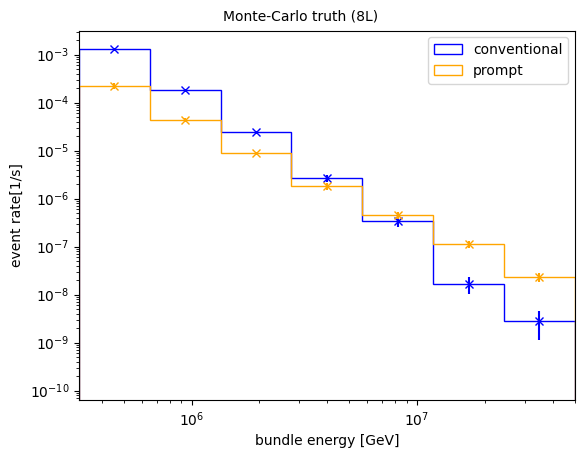

In [130]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsParent[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],CorsikaWeightMap.simweights_GaisserH3a[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.35,0.9,'Monte-Carlo truth (8L)')

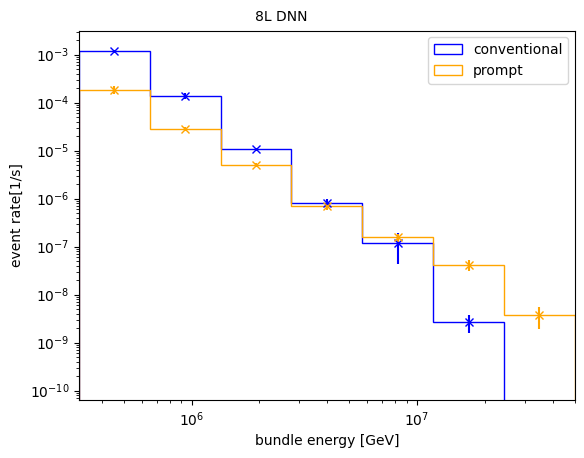

In [131]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.4,0.9,'8L DNN')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/spectrum_8L_bundle.pdf')

Text(0.4, 0.9, '8L DNN')

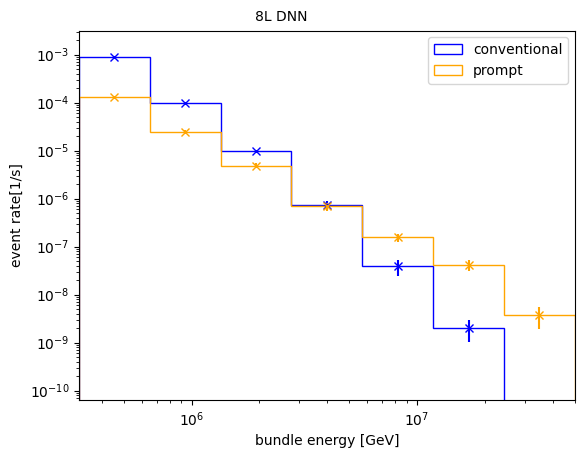

In [132]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsParent[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5],CorsikaWeightMap.simweights_GaisserH3a[df_DNN_energy.bundle_energy_at_entry_log_uncertainty<0.5])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.4,0.9,'8L DNN')

Text(0.35, 0.9, 'Monte-Carlo truth (4L)')

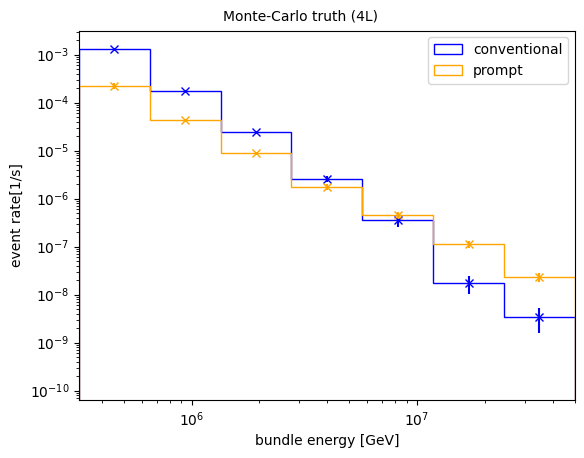

In [133]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsParent[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],CorsikaWeightMap.simweights_GaisserH3a[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.35,0.9,'Monte-Carlo truth (4L)')

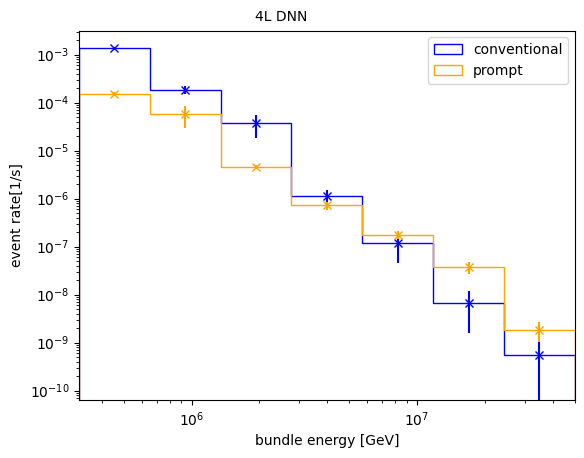

In [134]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_s,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.4,0.9,'4L DNN')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/spectrum_4L_bundle.pdf')

Text(0.4, 0.9, '4L DNN')

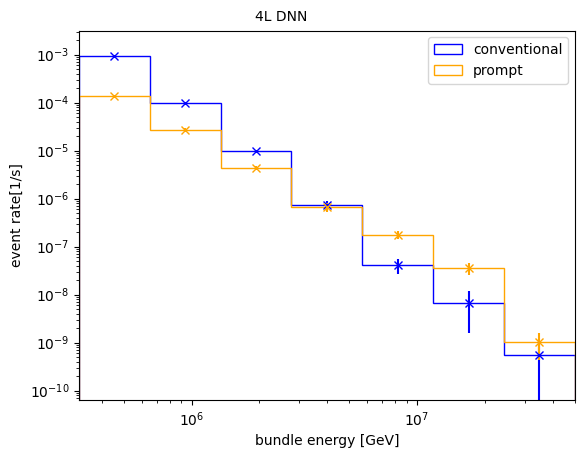

In [135]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_s[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],df_MCLabelsParent[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5],CorsikaWeightMap.simweights_GaisserH3a[df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<0.5])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.4,0.9,'4L DNN')

(6.309573444801942e-11, 0.0031622776601683794)

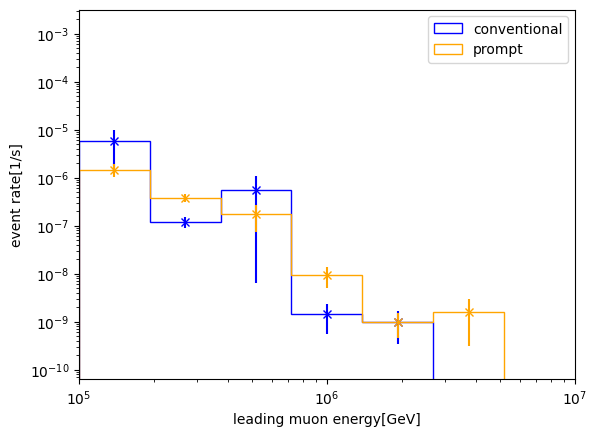

In [136]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy_s_max,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])

(6.309573444801942e-11, 0.0031622776601683794)

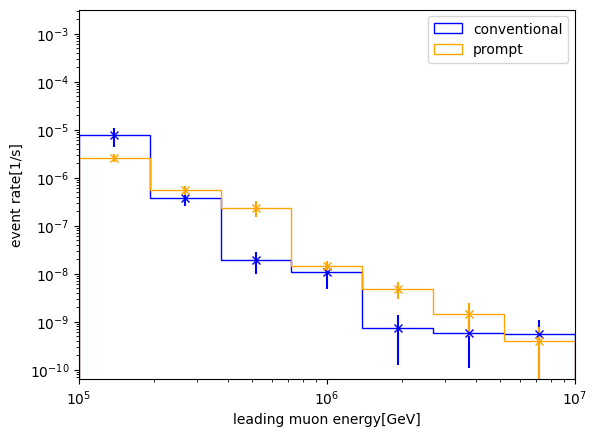

In [137]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_leading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])

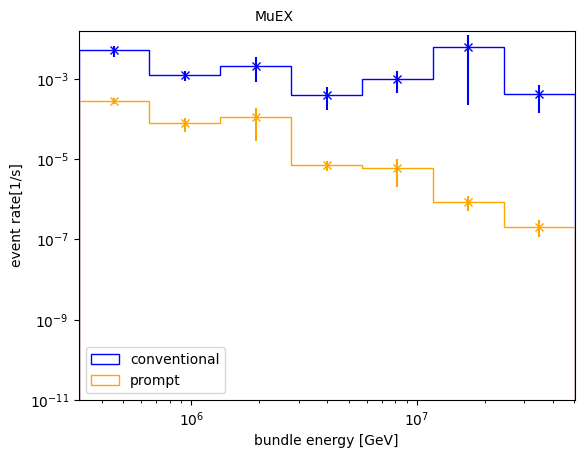

In [138]:
b2=np.logspace(5.5,7.7,8)
plt.hist(df_energy_MuEX.energy[df_MCLabelsParent.is_prompt_dennis==0],bins=b2,histtype='step', log=True, label='conventional', weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0],color='blue')
plt.hist(df_energy_MuEX.energy[df_MCLabelsParent.is_prompt_dennis==1], bins=b2, histtype='step',log=True,label='prompt', weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1],color='orange')
plt.xscale('log')
plt.xlim([10**5.5,10**7.7])
plt.xlabel('bundle energy [GeV]')
plt.ylabel('event rate[1/s]')
plt.legend()
errors_conventional, error_edges_conventional=bh.numpy.histogram(df_energy_MuEX.energy[df_MCLabelsParent.is_prompt_dennis==0],bins=b2,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(df_energy_MuEX.energy[df_MCLabelsParent.is_prompt_dennis==1],bins=b2,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(df_energy_MuEX.energy[df_MCLabelsParent.is_prompt_dennis==0],bins=b2, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(df_energy_MuEX.energy[df_MCLabelsParent.is_prompt_dennis==1],bins=b2, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1])
mids=10**(np.log10(b2)[:(np.size(b2)-1)]+np.diff(np.log10(b2))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x',color='blue')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x',color='orange')
plt.figtext(0.4,0.9,'MuEX')
plt.ylim([10**(-11),10**(-1.8)])
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/spectrum_muex_bundle.pdf')

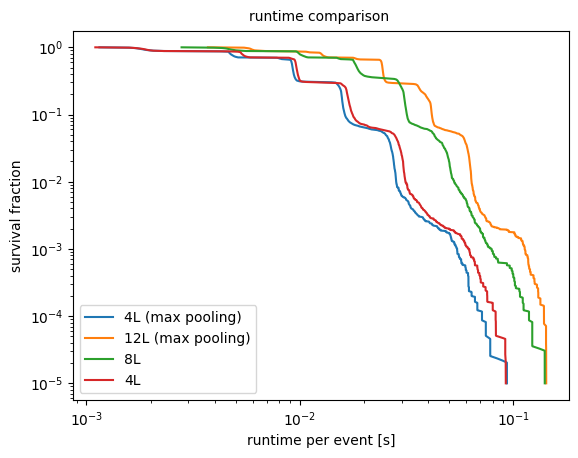

In [139]:
p2=np.logspace(-5,0,1000)
plt.plot(np.quantile(df_DNN_energy_s_max.runtime_prediction,1-p2),p2,label='4L (max pooling)')
plt.plot(np.quantile(df_DNN_energy_bigger_max.runtime_prediction,1-p2),p2,label='12L (max pooling)')
#plt.plot(np.quantile(df_DNN_energy_s_bias.runtime_prediction,1-p2),p2,label='4L')
#plt.plot(np.quantile(df_DNN_energy_bigger_conv.runtime_prediction,1-p2),p2,label='12L')
#plt.plot(np.quantile(df_DNN_energy_num.runtime_prediction,1-p2),p2,label='num')
plt.plot(np.quantile(df_DNN_energy.runtime_prediction,1-p2),p2,label='8L')
plt.plot(np.quantile(df_DNN_energy_s.runtime_prediction,1-p2),p2,label='4L')
#plt.plot(np.quantile(df_DNN_bundle.runtime_prediction,1-p2),p2,label='12L max (bundle only)')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.figtext(0.4,0.9,'runtime comparison')
plt.xlabel('runtime per event [s]')
plt.ylabel('survival fraction')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/runtime_prediction_comparison.pdf')

(0.000630957344480193, 0.15848931924611134)

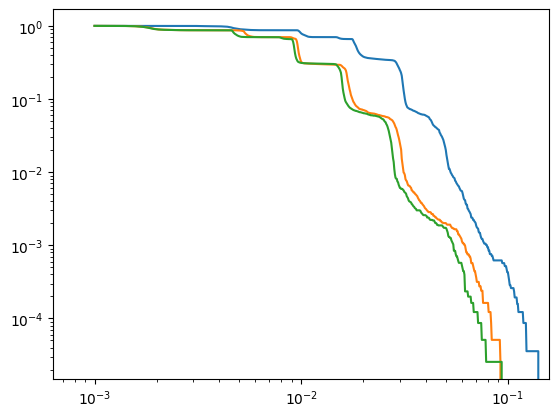

In [140]:
length=np.logspace(-3,0,1000)
runtime_survival_prediction=np.zeros(np.size(length))
runtime_survival_prediction_s=np.zeros(np.size(length))
runtime_survival_prediction_s_max=np.zeros(np.size(length))
runtime_survival_prediction_s_max=np.zeros(np.size(length))
#runtime_survival_prediction_MuEX=np.zeros(np.size(length))
for i in range(np.size(length)):
    runtime_survival_prediction[i]=np.size(df_DNN_energy.runtime_prediction[df_DNN_energy.runtime_prediction>=length[i]])/np.size(df_DNN_energy.runtime_prediction)
    runtime_survival_prediction_s[i]=np.size(df_DNN_energy_s.runtime_prediction[df_DNN_energy_s.runtime_prediction>=length[i]])/np.size(df_DNN_energy_s.runtime_prediction)
    runtime_survival_prediction_s_max[i]=np.size(df_DNN_energy_s_max.runtime_prediction[df_DNN_energy_s_max.runtime_prediction>=length[i]])/np.size(df_DNN_energy_s_max.runtime_prediction)
    #runtime_survival_prediction_MuEX[i]=np.size(df_energy_MuEX.speed[df_energy_MuEX.speed>=length[i]])/np.size(df_energy_MuEX.speed)
plt.plot(length, runtime_survival_prediction, label='8L')
plt.plot(length, runtime_survival_prediction_s, label='4L')
plt.plot(length, runtime_survival_prediction_s_max, label='medium model (8L)')
plt.xscale('log')
plt.yscale('log')
plt.xlim([10**(-3.2),10**(-0.8)])

In [141]:
print(np.mean(df_DNN_energy_s.runtime_prediction))
print(np.mean(df_DNN_energy_s_max.runtime_prediction))
print(np.mean(df_DNN_energy.runtime_prediction))
print(np.mean(df_DNN_bundle.runtime_prediction))
print(np.mean(df_DNN_energy.runtime_prediction/df_DNN_energy_s.runtime_prediction))
print(np.mean(df_DNN_energy_s.runtime_prediction/df_DNN_energy_s_max.runtime_prediction))
print(np.mean(df_DNN_energy_s_bias.runtime_prediction))

0.01098112658084297
0.010271765364231659
0.020595216954066846
0.025314321677862215
2.003831338048424
1.0674332579758867
0.01066423264097334


In [142]:
print('4L:',np.median(df_DNN_energy_s.runtime_prediction))
print('4L max:',np.median(df_DNN_energy_s_max.runtime_prediction))
print('8L:',np.median(df_DNN_energy.runtime_prediction))
print('12L:',np.median(df_DNN_energy_bigger_conv.runtime_prediction))
print('4L bias',np.median(df_DNN_energy_s_bias.runtime_prediction))
print('median(8L/4Lbias):',np.median(df_DNN_energy.runtime_prediction/df_DNN_energy_s.runtime_prediction))
print('median(4Lbias/4Lmax):',np.median(df_DNN_energy_s.runtime_prediction/df_DNN_energy_s_max.runtime_prediction))
print('median(12L/8L):',np.median(df_DNN_energy_bigger_conv.runtime_prediction/df_DNN_energy.runtime_prediction))
print('p(4Lbias>8L):',np.size(df_DNN_energy_s.runtime_prediction[df_DNN_energy_s.runtime_prediction>df_DNN_energy.runtime_prediction])/np.size(df_DNN_energy_s_bias.runtime_prediction))
print('p(4Lbias>4Lmax)',np.size(df_DNN_energy_s.runtime_prediction[df_DNN_energy_s.runtime_prediction>df_DNN_energy_s_max.runtime_prediction])/np.size(df_DNN_energy_s.runtime_prediction))

4L: 0.00964569445932284
4L max: 0.009246551722753793
8L: 0.018536887168884277
12L: 0.02469353299238719
4L bias 0.009631405584514141
median(8L/4Lbias): 1.8818558585590572
median(4Lbias/4Lmax): 1.0578978782749353
median(12L/8L): 1.3221693408937123
p(4Lbias>8L): 0.0010238647072307262
p(4Lbias>4Lmax) 0.9089931997045565


<ErrorbarContainer object of 3 artists>

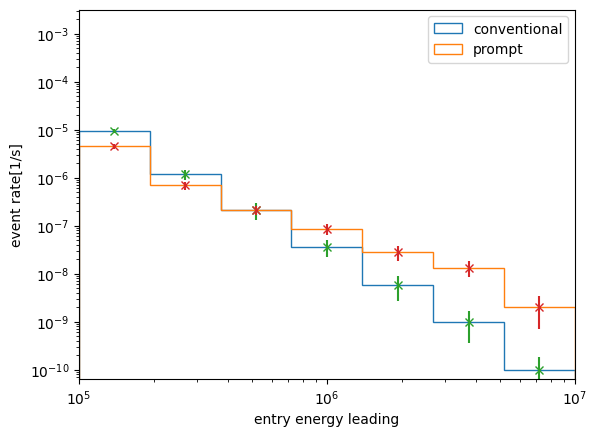

In [143]:
plt.hist(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==0]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==0])
plt.hist(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==1]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt',weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==1])
plt.xscale('log')
plt.xlim([10**5,10**7])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.xlabel('entry energy leading')
plt.ylabel('event rate[1/s]')
plt.legend()
errors_conventional, error_edges_conventional=bh.numpy.histogram(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==0]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==0],bins=b,weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==1]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==1],bins=b,weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==0]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==0],bins=b, weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(double_cut_bigger_max2.bundle_energy_at_entry[double_cut_Parent2.is_prompt_dennis==1]*double_cut_bigger_max2.leading_energy_rel_entry[double_cut_Parent2.is_prompt_dennis==1],bins=b, weights=double_cut_Corsika2.simweights_GaisserH3a[double_cut_Parent2.is_prompt_dennis==1])
mids=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x')

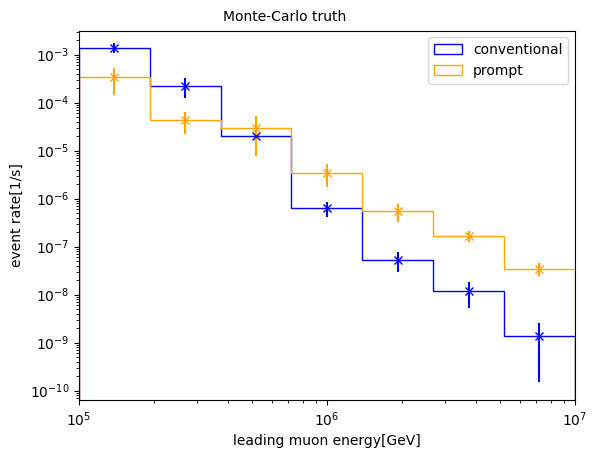

In [144]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.35,0.9,'Monte-Carlo truth')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/spectrum_MC_entry.pdf')

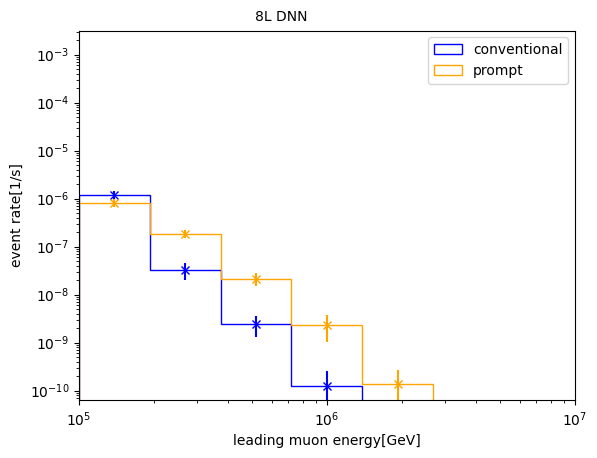

In [145]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.4,0.9,'8L DNN')
plt.savefig('/scratch/lflottau/lf/Auswertungen/spectrum_8L_entry.pdf')

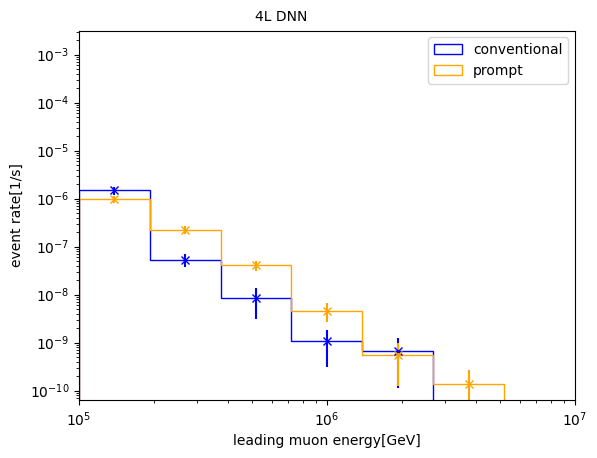

In [146]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy_s,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.4,0.9,'4L DNN')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/spectrum_4L_entry.pdf')

Text(0.35, 0.9, '4L DNN (max Pooling)')

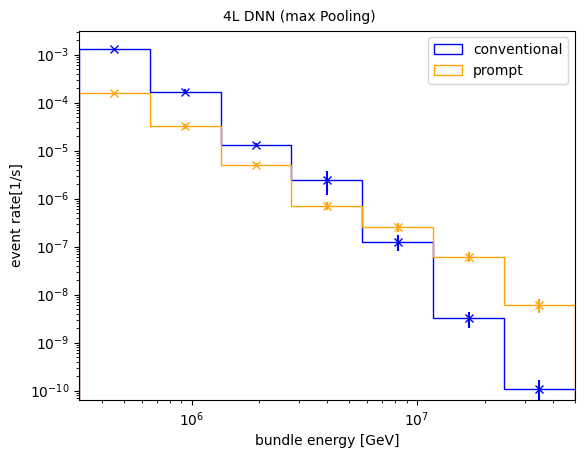

In [147]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_s_max,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])
plt.figtext(0.35,0.9,'4L DNN (max Pooling)')

In [148]:
c=np.linspace(0.1,1,100)
cp=np.array([])
cp_m=np.array([])
cfraction=np.array([])
cfraction_m=np.array([])
for i in range(np.size(c)):
    c_pred,c_true,c_weight,c_Parent=cut(df_DNN_energy_s.bundle_energy_at_entry_log_uncertainty<=c[i],df_DNN_energy_s,0,1)
    cp=np.append(cp,np.corrcoef(c_pred.bundle_energy_at_entry,c_true.bundle_energy_at_entry)[0,1])
    cfraction=np.append(cfraction, np.size(c_true.entry_energy)/np.size(df_MCLabelsLeading.entry_energy))
    c_pred_m,c_true_m,c_weight_m,c_Parent_m=cut(df_DNN_energy.bundle_energy_at_entry_log_uncertainty<=c[i],df_DNN_energy,0,1)
    cp_m=np.append(cp_m,np.corrcoef(c_pred_m.bundle_energy_at_entry,c_true_m.bundle_energy_at_entry)[0,1])
    cfraction_m=np.append(cfraction_m, np.size(c_true_m.entry_energy)/np.size(df_MCLabelsLeading.entry_energy))

fraction total cut: 0.0003718513613325523
fraction prompt cut: 0.0008038925322614766
fraction bundle prompt over 10**5: 0.0011127379209370425
fraction total cut: 0.006499758041922421
fraction prompt cut: 0.015231647979691136
fraction bundle prompt over 10**5: 0.02109407133204066
fraction total cut: 0.002098667957109747
fraction prompt cut: 0.003934842394753543
fraction bundle prompt over 10**5: 0.005446559297218156
fraction total cut: 0.02742021750757711
fraction prompt cut: 0.05309921726253438
fraction bundle prompt over 10**5: 0.07362359715611963
fraction total cut: 0.013753406515039604
fraction prompt cut: 0.023101332769198225
fraction bundle prompt over 10**5: 0.031976573938506586
fraction total cut: 0.06718793775310089
fraction prompt cut: 0.12189549397080601
fraction bundle prompt over 10**5: 0.1680474763499618
fraction total cut: 0.05876270279907292
fraction prompt cut: 0.10653691559128411
fraction bundle prompt over 10**5: 0.14723279648609078
fraction total cut: 0.1124213636247

Text(0, 0.5, 'pearson correlation coefficient')

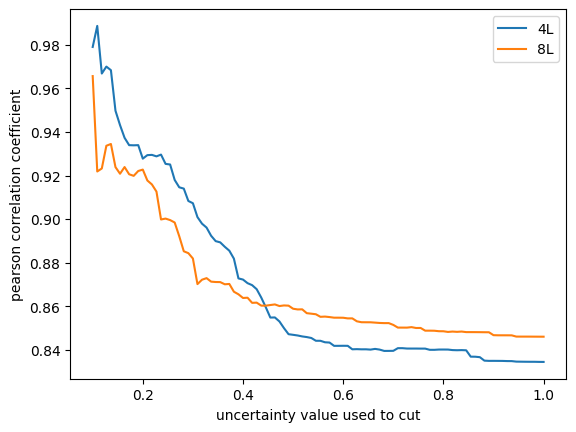

In [149]:
plt.plot(c,cp,label='4L')
plt.plot(c,cp_m,label='8L')
plt.legend()
plt.xlabel('uncertainty value used to cut')
plt.ylabel('pearson correlation coefficient')

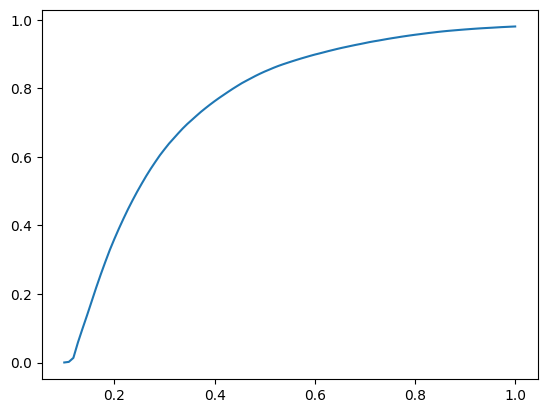

In [150]:
plt.plot(c,cfraction)
#plt.plot(c,cfraction,label='8L')
#plt.legend()

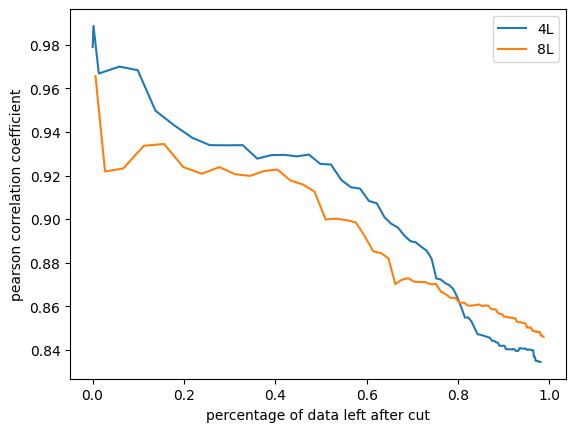

In [151]:
plt.plot(cfraction,cp,label='4L')
plt.plot(cfraction_m,cp_m,label='8L')
plt.ylabel('pearson correlation coefficient')
plt.xlabel('percentage of data left after cut')
plt.legend()

mean: -3.980808912128015e+19
std: 1.2003027812592212e+25
SignificanceResult(statistic=0.9341433579124266, pvalue=0.0)


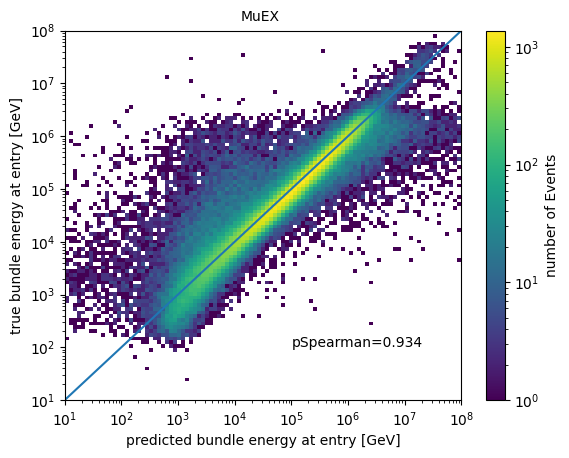

In [152]:
plt.hist2d(df_energy_MuEX.energy,df_MCLabelsLeading.bundle_energy_at_entry,bins=np.logspace(1,8,100),cmin=1, norm='log')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('predicted bundle energy at entry [GeV]')
plt.ylabel('true bundle energy at entry [GeV]')
plt.xlim([10**1,10**8])
plt.ylim([10**1,10**8])
plt.figtext(0.4,0.9,'MuEX')
plt.colorbar(label='number of Events')
plt.plot(bins_bundle,bins_bundle)
print('mean:', np.average(df_MCLabelsLeading.bundle_energy_at_entry-df_energy_MuEX.energy,weights=CorsikaWeightMap.simweights_GaisserH3a))
print('std:', np.std(df_MCLabelsLeading.bundle_energy_at_entry-df_energy_MuEX.energy))
print(scp.stats.spearmanr(df_MCLabelsLeading.bundle_energy_at_entry,df_energy_MuEX.energy))
#under, bi, digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,df_energy_MuEX.energy,bins=np.logspace(2,8,100),statistic=under_5)
#over, bi, digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,df_energy_MuEX.energy,bins=np.logspace(2,8,100),statistic=over_5)
under, bi, digitized=scp.stats.binned_statistic(df_energy_MuEX.energy,df_MCLabelsLeading.bundle_energy_at_entry,bins=np.logspace(2,8,100),statistic=under_5)
over, bi, digitized=scp.stats.binned_statistic(df_energy_MuEX.energy,df_MCLabelsLeading.bundle_energy_at_entry,bins=np.logspace(2,8,100),statistic=over_5)
#plt.plot(mid(np.logspace(2,8,100)),under,color='red')
#plt.plot(mid(np.logspace(2,8,100)),over,color='red')
plt.text(10**5,10**2,'pSpearman=0.934')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_muex_bundle.pdf')

SignificanceResult(statistic=0.9341433579124266, pvalue=0.0)


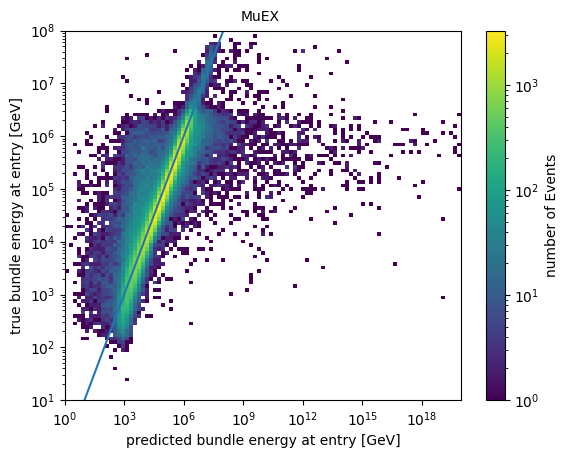

In [153]:
plt.hist2d(df_energy_MuEX.energy,df_MCLabelsLeading.bundle_energy_at_entry,bins=[np.logspace(0,20,100),np.logspace(1,8,100)],cmin=1, norm='log')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('predicted bundle energy at entry [GeV]')
plt.ylabel('true bundle energy at entry [GeV]')
#plt.xlim([10**0,10**20])
plt.ylim([10**1,10**8])
#plt.figtext(0.25,0.9,'Correlation bundle energy MuEX')
plt.colorbar(label='number of Events')
plt.plot(bins_bundle,bins_bundle)
print(scp.stats.spearmanr(df_MCLabelsLeading.bundle_energy_at_entry,df_energy_MuEX.energy))
plt.figtext(0.4,0.9,'MuEX')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_muex_bundle2.pdf')

/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


PearsonRResult(statistic=0.3512185908989822, pvalue=0.0)
SignificanceResult(statistic=0.8460640360972985, pvalue=0.0)


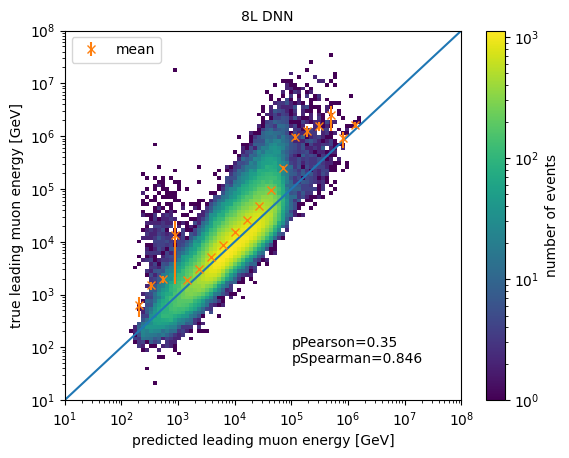

In [154]:
correlation_plot(df_DNN_energy,df_MCLabelsLeading,1,8,0)
add_mean_error_entry(df_DNN_energy,df_MCLabelsLeading,np.logspace(1,8,100),3)
print(scp.stats.pearsonr(df_DNN_energy.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
print(scp.stats.spearmanr(df_DNN_energy.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
plt.text(10**5,10**2,'pPearson=0.35')
plt.text(10**5,10**1.7,'pSpearman=0.846')
plt.figtext(0.4,0.9,'8L DNN')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_8L_entry.pdf')

/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


PearsonRResult(statistic=0.3401688616017532, pvalue=0.0)
SignificanceResult(statistic=0.842043978791265, pvalue=0.0)


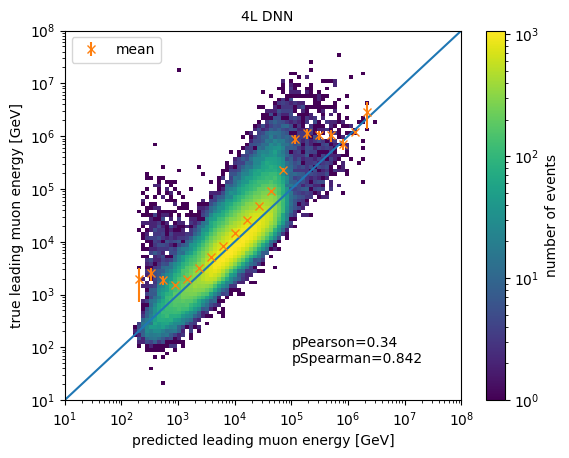

In [155]:
correlation_plot(df_DNN_energy_s,df_MCLabelsLeading,1,8,0)
add_mean_error_entry(df_DNN_energy_s,df_MCLabelsLeading,np.logspace(1,8,100),3)
print(scp.stats.pearsonr(df_DNN_energy_s.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
print(scp.stats.spearmanr(df_DNN_energy_s.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
plt.text(10**5,10**2,'pPearson=0.34')
plt.text(10**5,10**1.7,'pSpearman=0.842')
plt.figtext(0.4,0.9,'4L DNN')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/correlation_4L_entry.pdf')

In [156]:
print(np.size(df_DNN_energy_s.entry_energy[np.all([df_DNN_energy_s.entry_energy>10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>10**5]))

0.08919929608446986


In [157]:
print(np.size(df_DNN_energy_bigger_max.entry_energy[np.all([df_DNN_energy_bigger_max.bundle_energy_at_entry*df_DNN_energy_bigger_max.leading_energy_rel_entry>10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>10**5]))

0.22250329960404752


In [158]:
np.size(df_DNN_energy_s.entry_energy[np.all([df_DNN_energy_s.entry_energy>10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])
np.size(df_MCLabelsLeading.entry_energy>10**5)

196315

fraction prompt: 0.4340558537745464
fraction over 10**4: 0.3389713318610555


/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


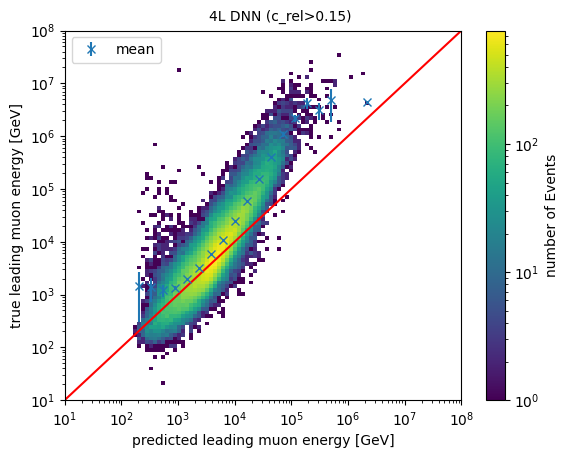

In [159]:
c_rel=0.15
bins_entry=np.logspace(1,8,100)
entry_energy_pred_cut_rel=df_DNN_energy_s[df_MCLabelsLeading.leading_energy_rel_entry>c_rel]
entry_energy_true_cut_rel=df_MCLabelsLeading[df_MCLabelsLeading.leading_energy_rel_entry>c_rel]
entry_energy_weights_cut_rel=CorsikaWeightMap[df_MCLabelsLeading.leading_energy_rel_entry>c_rel]
entry_energy_Parent_cut_rel=df_MCLabelsParent[df_MCLabelsLeading.leading_energy_rel_entry>c_rel]
plt.hist2d(entry_energy_pred_cut_rel.entry_energy,entry_energy_true_cut_rel.entry_energy,bins=bins_entry,range=[[np.min(entry_energy_true_cut_rel.entry_energy),np.max(entry_energy_true_cut_rel.entry_energy)],[np.min(entry_energy_pred_cut_rel.entry_energy),np.max(entry_energy_pred_cut_rel.entry_energy)]],norm='log')
plt.xlabel('predicted leading muon energy [GeV]')
plt.ylabel('true leading muon energy [GeV]')
plt.yscale('log')
plt.xscale('log')
plt.plot(bins_entry,bins_entry,'r')
plt.xlim([10**1,10**8])
plt.ylim([10**1,10**8])
plt.colorbar(label='number of Events')
print('fraction prompt:',np.size(entry_energy_Parent_cut_rel.is_last_interaction_prompt_00[entry_energy_Parent_cut_rel.is_last_interaction_prompt_00==1])/np.size(df_MCLabelsParent.is_last_interaction_prompt_00[df_MCLabelsParent.is_last_interaction_prompt_00==1]))
print('fraction over 10**4:', np.size(entry_energy_true_cut_rel.entry_energy[entry_energy_true_cut_rel.entry_energy>=10**4])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>=10**4]))
np.size(entry_energy_pred_cut_rel.entry_energy)/np.size(df_DNN_energy.entry_energy)
add_mean_error_entry(entry_energy_pred_cut_rel, entry_energy_true_cut_rel, bins_entry, 3)
scp.stats.spearmanr(entry_energy_pred_cut_rel.entry_energy,entry_energy_true_cut_rel.entry_energy)
plt.figtext(0.35,0.9,'4L DNN (c_rel>0.15)')
plt.savefig('/scratch/lflottau/lf/Auswertungen/Plots/spectrum_4L_entry_rel_cut.pdf')

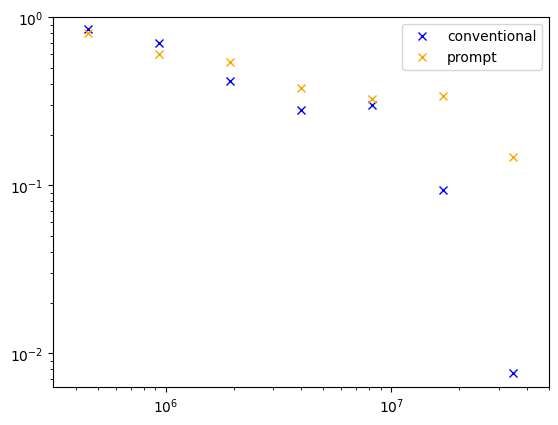

In [160]:
prompt_conventional_fraction_bundle(np.logspace(5.5,7.7,8),df_DNN_energy, df_MCLabelsLeading, df_MCLabelsParent, CorsikaWeightMap.simweights_GaisserH3a)

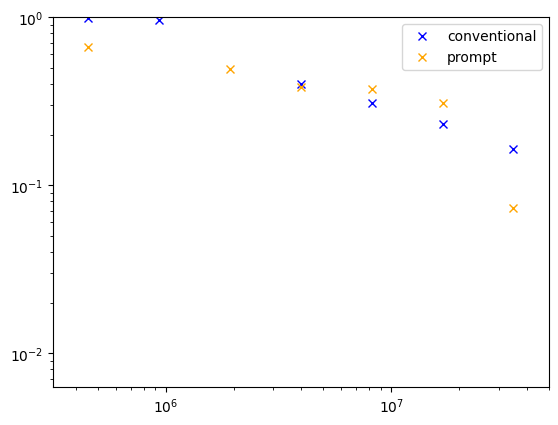

In [161]:
prompt_conventional_fraction_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_s, df_MCLabelsLeading, df_MCLabelsParent, CorsikaWeightMap.simweights_GaisserH3a)

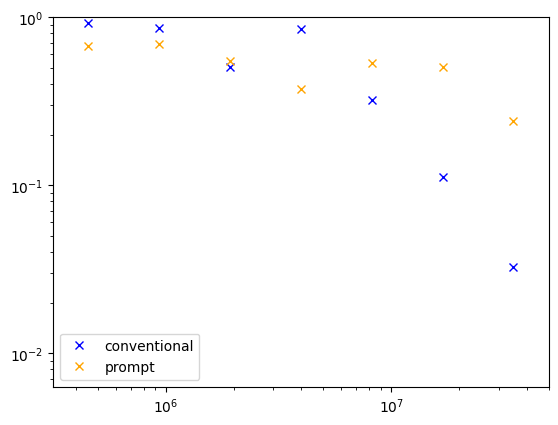

In [162]:
prompt_conventional_fraction_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_s_max, df_MCLabelsLeading, df_MCLabelsParent, CorsikaWeightMap.simweights_GaisserH3a)

PearsonRResult(statistic=0.8711086659799022, pvalue=0.0)

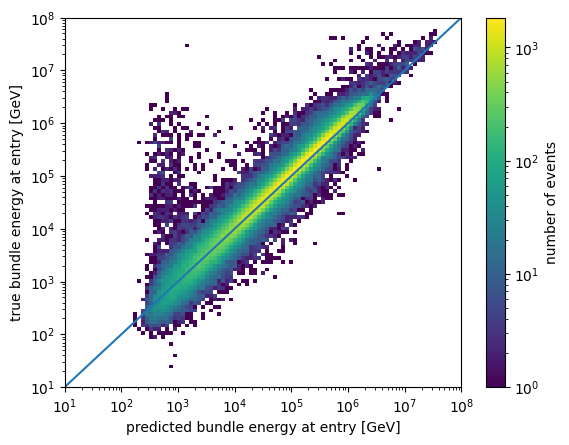

In [163]:
correlation_plot(df_DNN_energy_s_max2,df_MCLabelsLeading2,1,8,1)
scp.stats.pearsonr(df_DNN_energy_s_max2.bundle_energy_at_entry,df_MCLabelsLeading2.bundle_energy_at_entry)

(6.309573444801942e-11, 0.0031622776601683794)

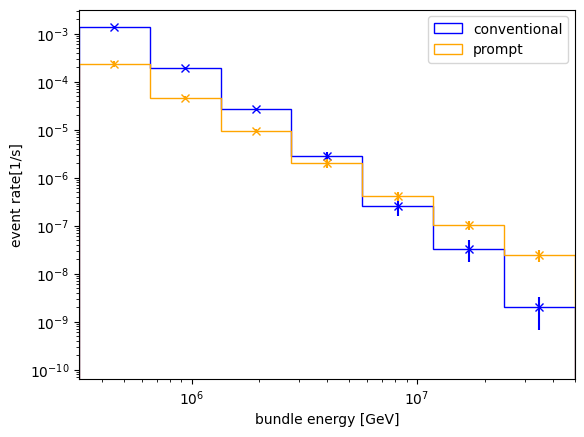

In [164]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading2,df_MCLabelsParent2,CorsikaWeightMap2.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])

In [165]:
np.size(df_MCLabelsLeading.bundle_energy_at_entry[df_MCLabelsLeading.bundle_energy_at_entry>10**6])/np.size(df_MCLabelsLeading.bundle_energy_at_entry)

0.07584749000331101

In [166]:
d=df_DNN_energy_s.entry_energy[df_MCLabelsLeading.entry_energy>10**5]
d2=d[d>10**5]
print(np.size(d2))
np.size(df_DNN_energy_s.entry_energy[df_MCLabelsLeading.entry_energy>10**5])


811


9092

In [167]:
np.size(df_DNN_energy.entry_energy[np.all([df_DNN_energy_s.entry_energy>10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])

811